### Predict weekly sales of Wallmart stores using the following data sets (key indicators)
- Historical Sales
- Markdown Data
- Macro-economic indicators

In [3]:
## Importing necessary libraries

import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Reading the required data files

sales_data = pd.read_csv('sales_data.csv')
stores_data = pd.read_csv('stores.csv')
features_data = pd.read_csv('features.csv')

### EDA Section

In [5]:
sales_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [6]:
sales_data.isna().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [7]:
sales_data.dtypes

Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object

In [8]:
sales_data.shape

(421570, 5)

In [9]:
sales_data.nunique()

Store               45
Dept                81
Date               143
Weekly_Sales    359464
IsHoliday            2
dtype: int64

In [10]:
sales_data.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


In [11]:
## Checking number of stores with minimal sales reported 
sales_data_check = sales_data.loc[sales_data['Weekly_Sales'] <= 0]
sales_data_check.shape

(1358, 5)

In [12]:
sales_data_check.nunique()

Store            45
Dept             51
Date            143
Weekly_Sales    679
IsHoliday         2
dtype: int64

In [13]:
## 0.33 percent of stores approximately have less than 0 sales
(sales_data_check.shape[0] / sales_data.shape[0]) * 100

0.3221291837654482

In [14]:
sales_data['Store'] = sales_data['Store'].astype(str)
sales_data['Dept'] = sales_data['Dept'].astype(str)
sales_data['IsHoliday'] = sales_data['IsHoliday']*1

In [15]:
## Dropping this small percentage of records having minimal sales
sales_data2 = sales_data.loc[sales_data['Weekly_Sales']>0]
sales_data2.shape

(420212, 5)

In [16]:
sales_data2.dtypes

Store            object
Dept             object
Date             object
Weekly_Sales    float64
IsHoliday         int64
dtype: object

In [17]:
# Function block for generating descriptive statistics

def get_basic_stats(dfname):
    print("Shape of dataframe is " + str(dfname.shape))
    print("Below are datatypes of columns in DF")
    print(dfname.dtypes.sort_values())
    print("Below are missing values in each column")
    print(dfname.isna().sum().sort_values())
    print("Below are the number of unique values taken by a column")
    print(dfname.nunique().sort_values())
    print("Below are some records in DF")
    print(dfname.head())
    print("Basic Stats for numeric variables")
    print(dfname.describe())

In [18]:
get_basic_stats(features_data)

Shape of dataframe is (8190, 12)
Below are datatypes of columns in DF
IsHoliday          bool
Store             int64
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
Date             object
dtype: object
Below are missing values in each column
Store              0
Date               0
Temperature        0
Fuel_Price         0
IsHoliday          0
CPI              585
Unemployment     585
MarkDown5       4140
MarkDown1       4158
MarkDown3       4577
MarkDown4       4726
MarkDown2       5269
dtype: int64
Below are the number of unique values taken by a column
IsHoliday          2
Store             45
Date             182
Unemployment     404
Fuel_Price      1011
CPI             2505
MarkDown2       2715
MarkDown3       2885
MarkDown4       3405
MarkDown1       4023
MarkDown5       4045
Temperature     4178
dtype: int64
Be

In [19]:
get_basic_stats(features_data)

Shape of dataframe is (8190, 12)
Below are datatypes of columns in DF
IsHoliday          bool
Store             int64
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
Date             object
dtype: object
Below are missing values in each column
Store              0
Date               0
Temperature        0
Fuel_Price         0
IsHoliday          0
CPI              585
Unemployment     585
MarkDown5       4140
MarkDown1       4158
MarkDown3       4577
MarkDown4       4726
MarkDown2       5269
dtype: int64
Below are the number of unique values taken by a column
IsHoliday          2
Store             45
Date             182
Unemployment     404
Fuel_Price      1011
CPI             2505
MarkDown2       2715
MarkDown3       2885
MarkDown4       3405
MarkDown1       4023
MarkDown5       4045
Temperature     4178
dtype: int64
Be

In [20]:
features_data['Store'] = features_data['Store'].astype(str)
stores_data['Store'] = stores_data['Store'].astype(str)

In [21]:
## Dropping Attribute
features_data2 = features_data.drop(['IsHoliday'], axis=1)

features_data2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106


### Missing Value Imputation

In [22]:
features_data2['Unemployment'].fillna(features_data2['Unemployment'].mean(), inplace=True)
features_data2['CPI'].fillna(features_data2['CPI'].mean(), inplace=True)
features_data2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106


In [23]:
## Markdown columns mostly doesn't contain any values
## Logical reason for the same will be no markdowns
## Replacing the values with 0

features_data2.fillna(0, inplace=True)
features_data2.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106


In [24]:
## Arranging the stores data by type and finding the average of each
stores_data.groupby('Type').agg({'Size': 'mean'})

,Size
Type,
A,177247.727273
B,101190.705882
C,40541.666667


### Data Preparation

- Stores Unique Key = Store
- Features Data Unique Key = Store+Date
- Sales Data Unique Key = Store+Dept+Date

In [25]:
# Checking if the above assumptions are correct

features_data2.groupby(['Store', 'Date']).size().shape[0] - features_data2.shape[0]

0

In [26]:
sales_data.groupby(['Store', 'Dept', 'Date']).size().shape[0] - sales_data.shape[0]

0

In [27]:
# Merging datasets (sales and features)

sales_features_data = pd.merge(sales_data2, features_data2, on=['Store', 'Date'], how='inner')
sales_features_data.shape

(420212, 14)

In [28]:
sales_features_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106


In [29]:
combined_data = pd.merge(sales_features_data, stores_data, on='Store', how='inner')
combined_data.shape

(420212, 16)

In [30]:
combined_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315


### Train and Test Set Split

In [31]:
# Correcting data format

combined_data['Date2'] = pd.to_datetime(combined_data['Date'], format = '%Y-%m-%d')

In [32]:
## Finding out week

print(combined_data['Date2'].nunique())
(combined_data['Date2'].max() - combined_data['Date2'].min())/7

143


Timedelta('142 days 00:00:00')

In [33]:
# Finding the date that features 70% time in the input data 
# Using the same date to divide the original data

unique_dates = pd.DataFrame(combined_data['Date2'].unique(), columns = ['date'])
unique_dates.sort_values('date', inplace = True)
splitter = round(unique_dates.shape[0]*0.7, 0)
split_date=unique_dates.iloc[int(splitter)-1]['date']
split_date

Timestamp('2011-12-30 00:00:00')

In [34]:
# Using this date to determine the split

combined_data_train = combined_data.loc[combined_data['Date2'] <= split_date]
combined_data_test = combined_data.loc[combined_data['Date2'] > split_date]
combined_data_train.shape[0]/combined_data.shape[0]

0.6977525629920136

In [35]:
combined_data_train.head()
combined_data_test.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size,Date2
7157,1,1,2012-01-06,16567.69,0,49.01,3.157,6277.39,21813.16,143.1,1450.13,8483.0,219.714258,7.348,A,151315,2012-01-06
7158,1,2,2012-01-06,44481.38,0,49.01,3.157,6277.39,21813.16,143.1,1450.13,8483.0,219.714258,7.348,A,151315,2012-01-06
7159,1,3,2012-01-06,13926.04,0,49.01,3.157,6277.39,21813.16,143.1,1450.13,8483.0,219.714258,7.348,A,151315,2012-01-06
7160,1,4,2012-01-06,40925.76,0,49.01,3.157,6277.39,21813.16,143.1,1450.13,8483.0,219.714258,7.348,A,151315,2012-01-06
7161,1,5,2012-01-06,23105.81,0,49.01,3.157,6277.39,21813.16,143.1,1450.13,8483.0,219.714258,7.348,A,151315,2012-01-06


### Univariate Analysis

(array([7157., 7140., 6309., 7175., 6286., 7121., 6796., 6909., 6158.,
        7206., 6988., 6736., 7324., 6995., 6886., 6482., 6823., 6818.,
        7077., 7119., 6651., 6733., 7017., 7137., 6824., 6867., 7127.,
        7058., 6604., 4990., 7071., 7122., 4470., 7177., 6586., 4321.,
        4947., 5066., 6885., 6979., 6987., 4729., 4707., 4932., 6712.]),
 array([ 0.        ,  0.97777778,  1.95555556,  2.93333333,  3.91111111,
         4.88888889,  5.86666667,  6.84444444,  7.82222222,  8.8       ,
         9.77777778, 10.75555556, 11.73333333, 12.71111111, 13.68888889,
        14.66666667, 15.64444444, 16.62222222, 17.6       , 18.57777778,
        19.55555556, 20.53333333, 21.51111111, 22.48888889, 23.46666667,
        24.44444444, 25.42222222, 26.4       , 27.37777778, 28.35555556,
        29.33333333, 30.31111111, 31.28888889, 32.26666667, 33.24444444,
        34.22222222, 35.2       , 36.17777778, 37.15555556, 38.13333333,
        39.11111111, 40.08888889, 41.06666667, 42.04444444,

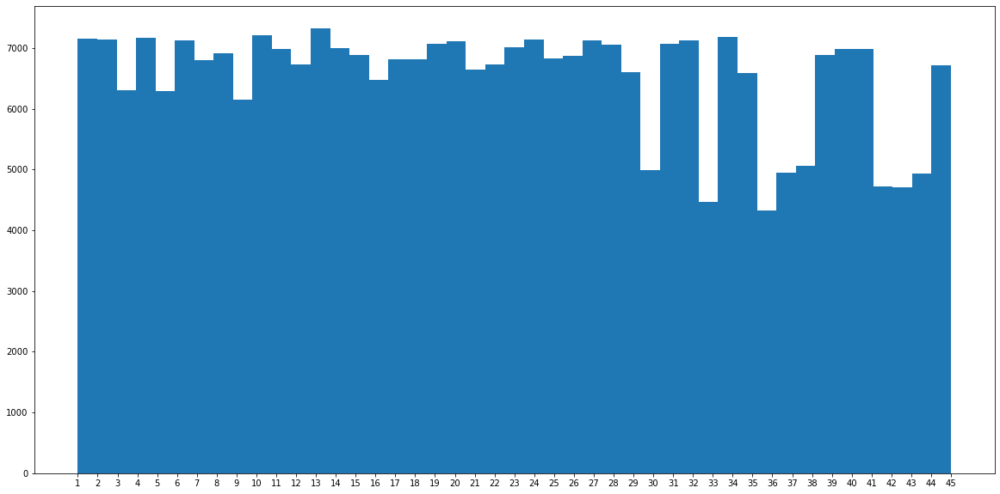

In [36]:
plt.figure(figsize=(20,10))
plt.hist(list(combined_data_train['Store']), bins = combined_data_train['Store'].nunique() )

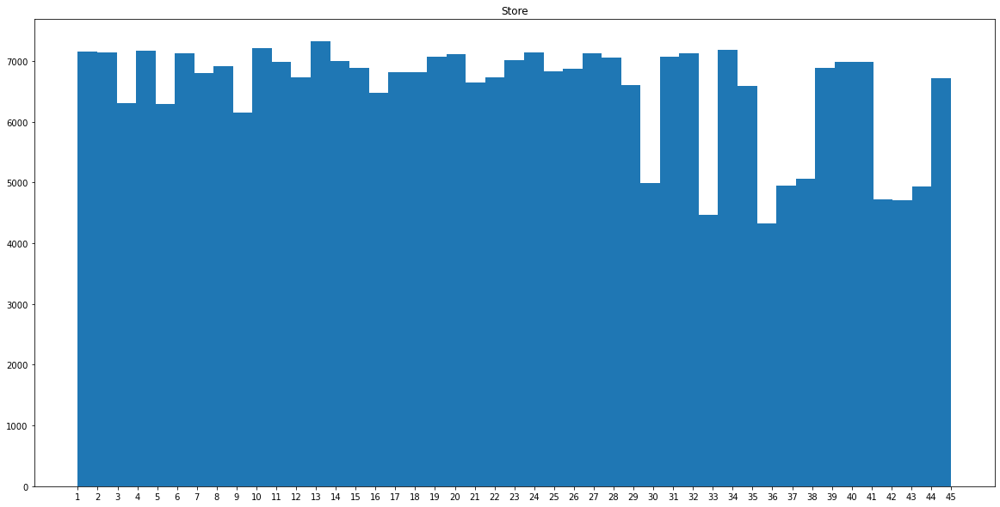

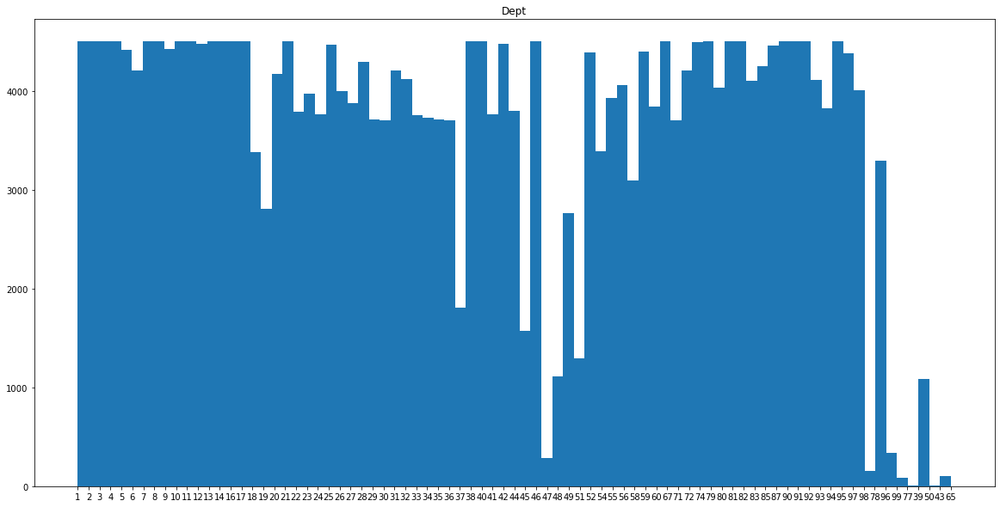

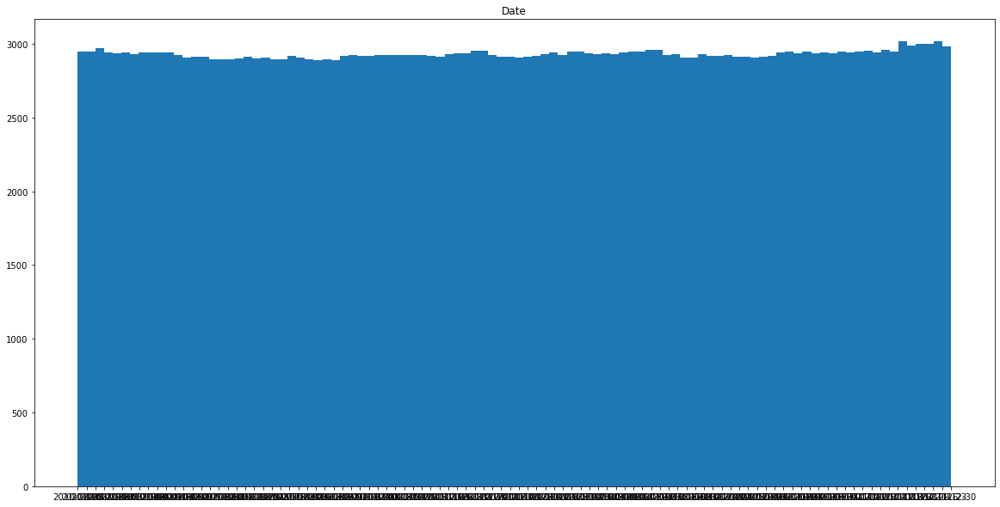

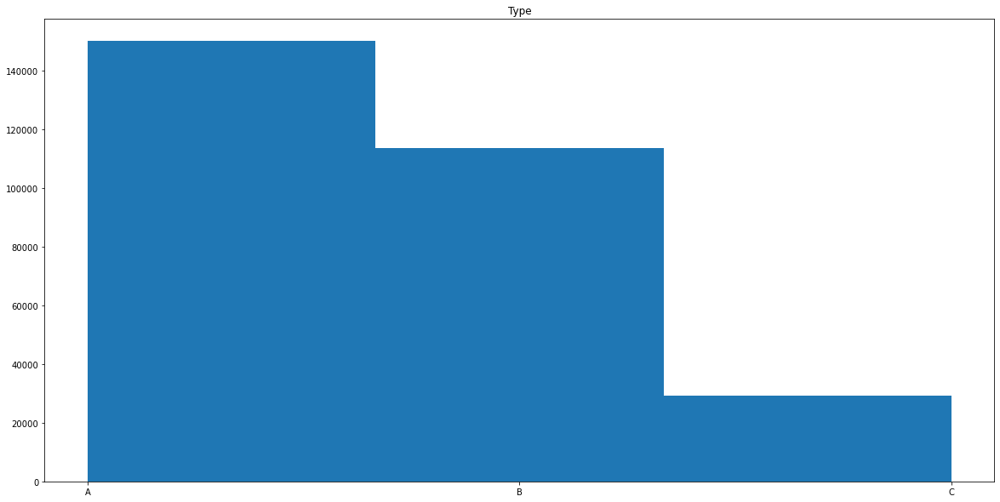

In [37]:
# Univariate analysis of categorical variables

cat_columns = combined_data_train.select_dtypes(np.object).columns.tolist()

for var in cat_columns:
    plt.figure(figsize = (20,10))
    plt.hist(list(combined_data_train[var]), bins = combined_data_train[var].nunique() )
    plt.title(var)
    plt.show

In [38]:
num_columns = combined_data_train.select_dtypes(np.number).columns.tolist()
mark_columns = [x for x in num_columns if 'Mark' in x]
mark_columns

['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

In [39]:
nonmark_columns = list(set(num_columns).difference(set(mark_columns)))
nonmark_columns

['IsHoliday',
 'Weekly_Sales',
 'Size',
 'CPI',
 'Unemployment',
 'Temperature',
 'Fuel_Price']

<AxesSubplot:>

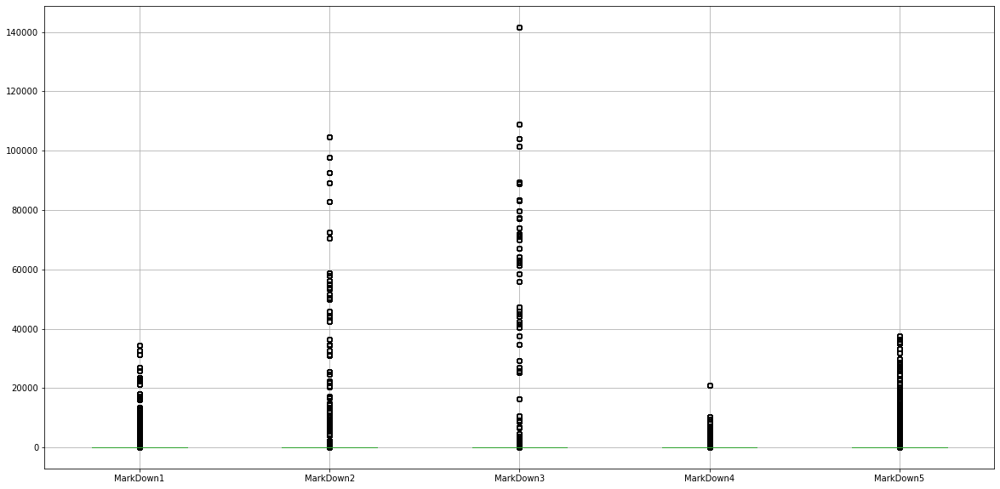

In [40]:
## Boxplot to find range of values in Markdown columns

combined_data_train.boxplot(column = mark_columns, figsize=(20,10))

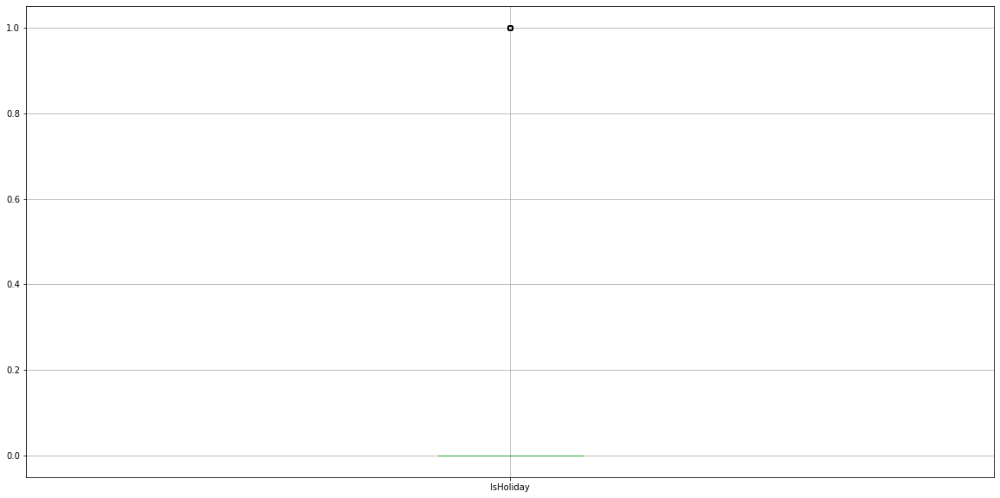

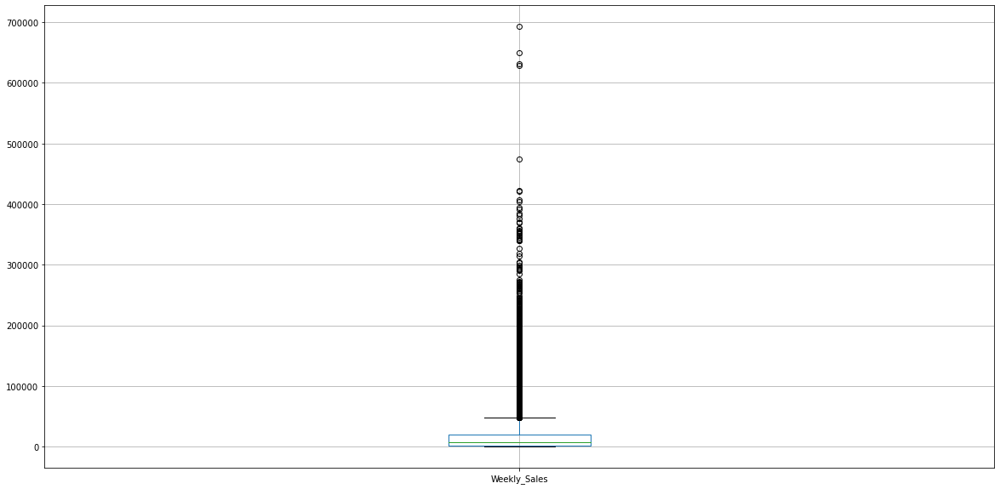

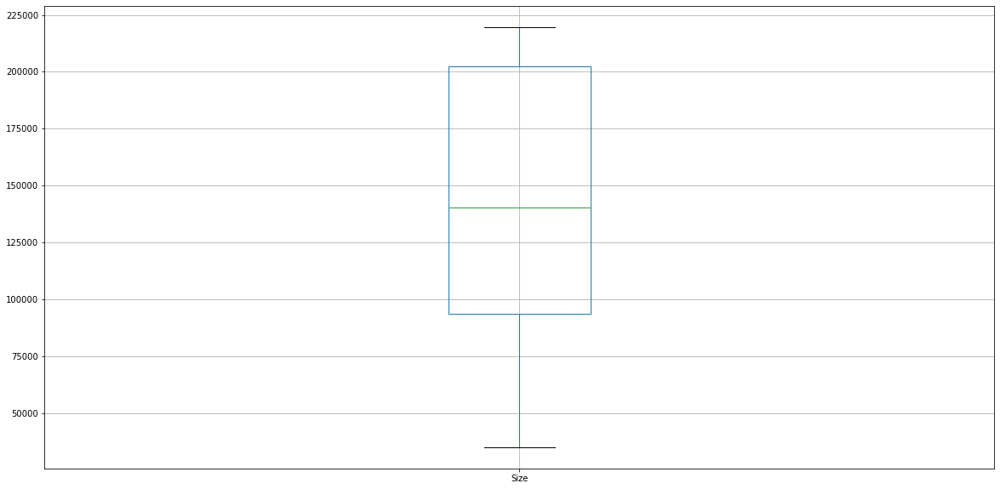

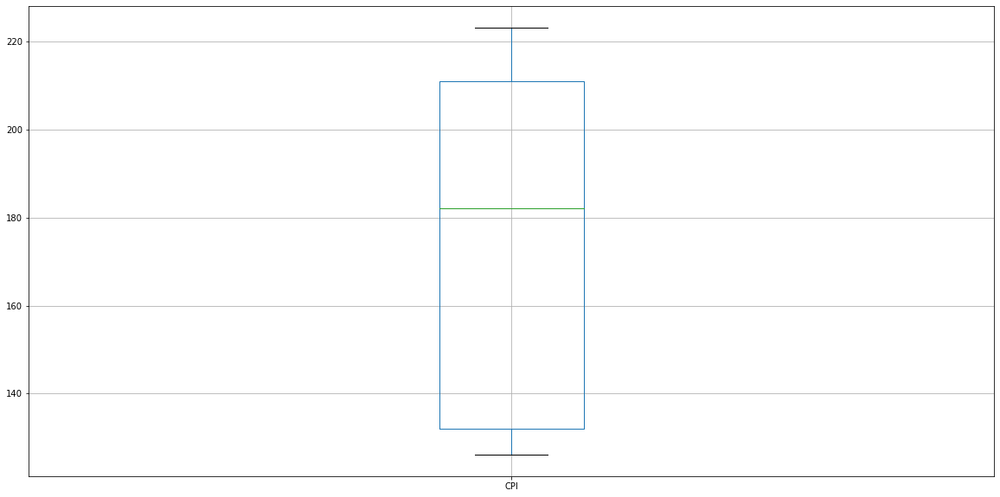

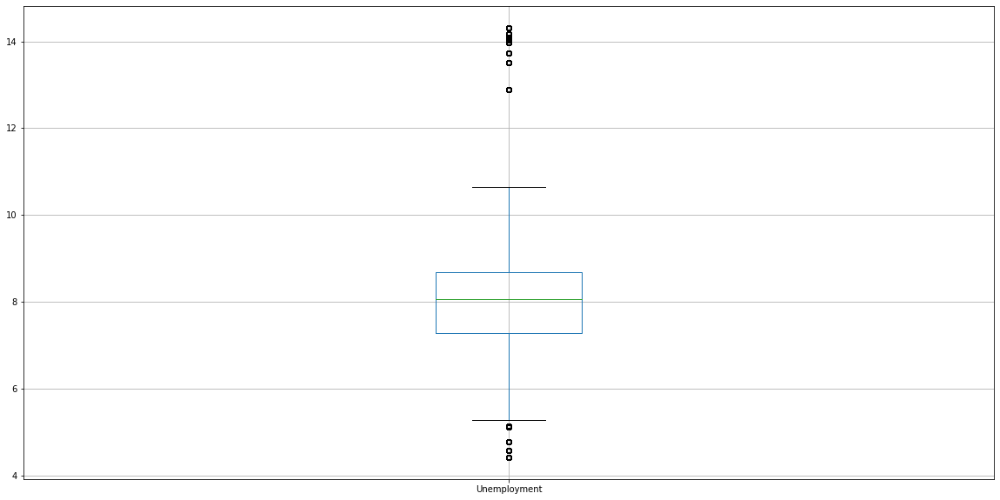

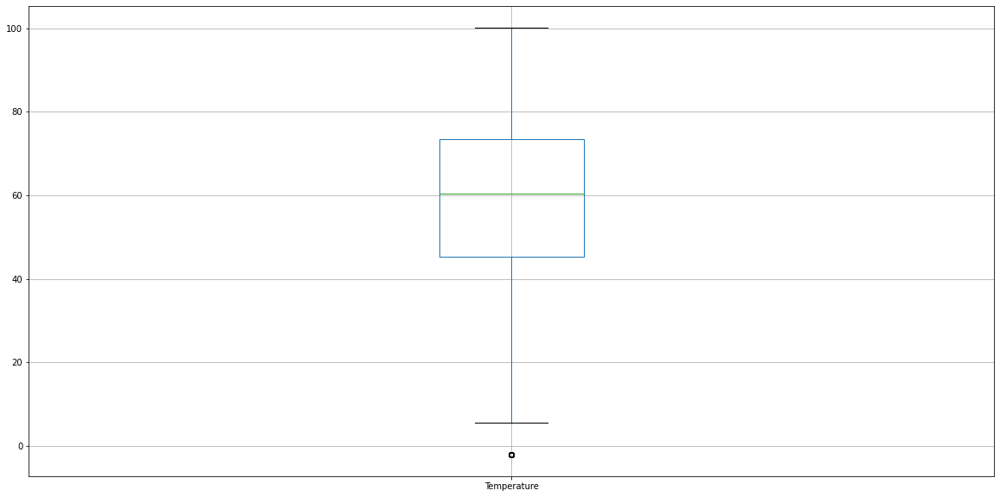

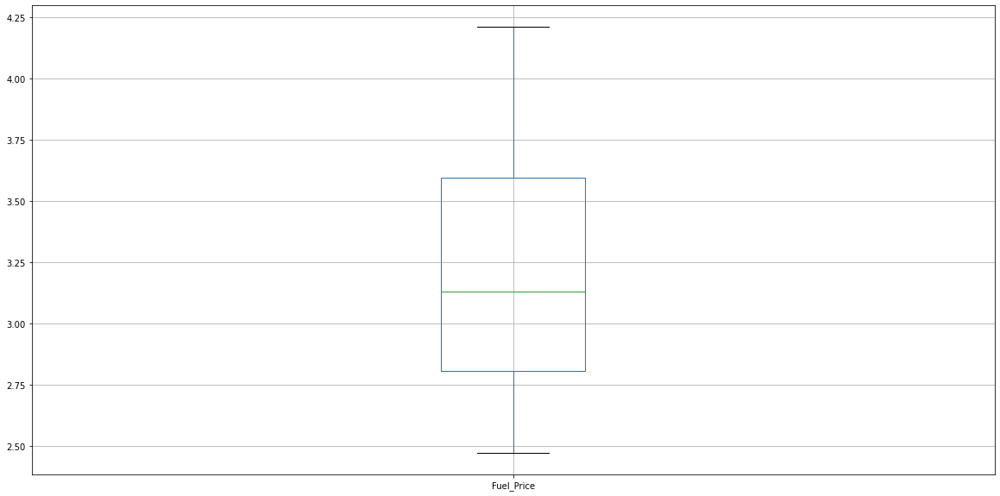

In [41]:
# ## Boxplot to find range of values in Non Mark columns

for var in nonmark_columns:
    combined_data_train.boxplot(column = var, figsize=(20,10))
    plt.show()

### Bivariate Analysis

In [42]:
## Only retaining the numerical columns

train_num = combined_data_train[num_columns]
train_num = train_num.drop(['Weekly_Sales'], axis=1)
train_num.head()

,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
0,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
1,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
2,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
3,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
4,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315


In [43]:
# Checking Correlations 

corr_values = train_num.corr().unstack().reset_index()
print(corr_values.shape)


corr_values2 = corr_values[corr_values['level_0'] > corr_values['level_1'] ]
print(corr_values2.shape)

corr_values2.columns = ['var1', 'var2', 'corr_value']
corr_values2['corr_abs'] = corr_values2['corr_value'].abs()
corr_values2.sort_values( 'corr_abs', ascending=False, inplace=True)
corr_values2.head(10)

(121, 3)
(55, 3)


,var1,var2,corr_value,corr_abs
69,MarkDown4,MarkDown1,0.764146,0.764146
83,MarkDown5,MarkDown4,0.673759,0.673759
80,MarkDown5,MarkDown1,0.573937,0.573937
47,MarkDown2,MarkDown1,0.364552,0.364552
107,Unemployment,CPI,-0.298205,0.298205
55,MarkDown3,IsHoliday,0.296824,0.296824
44,MarkDown2,IsHoliday,0.272442,0.272442
70,MarkDown4,MarkDown2,0.232324,0.232324
30,Fuel_Price,CPI,-0.180454,0.180454
11,Temperature,IsHoliday,-0.178936,0.178936


<AxesSubplot:>

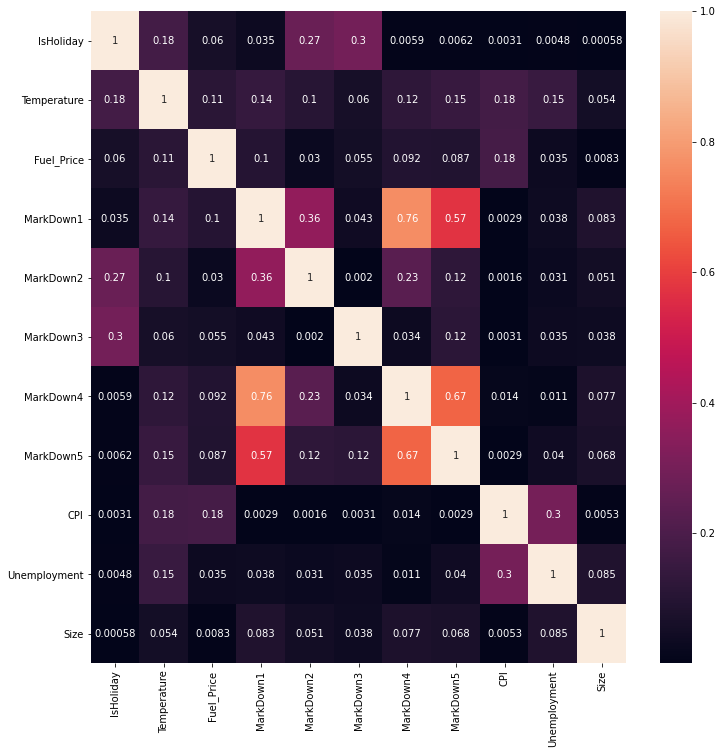

In [44]:
# Heatmap visual to ascertain correlations

plt.figure(figsize=(12, 12))
vg_corr = train_num.corr().abs()
sns.heatmap(vg_corr, xticklabels = vg_corr.columns.values,yticklabels = vg_corr.columns.values, annot = True)

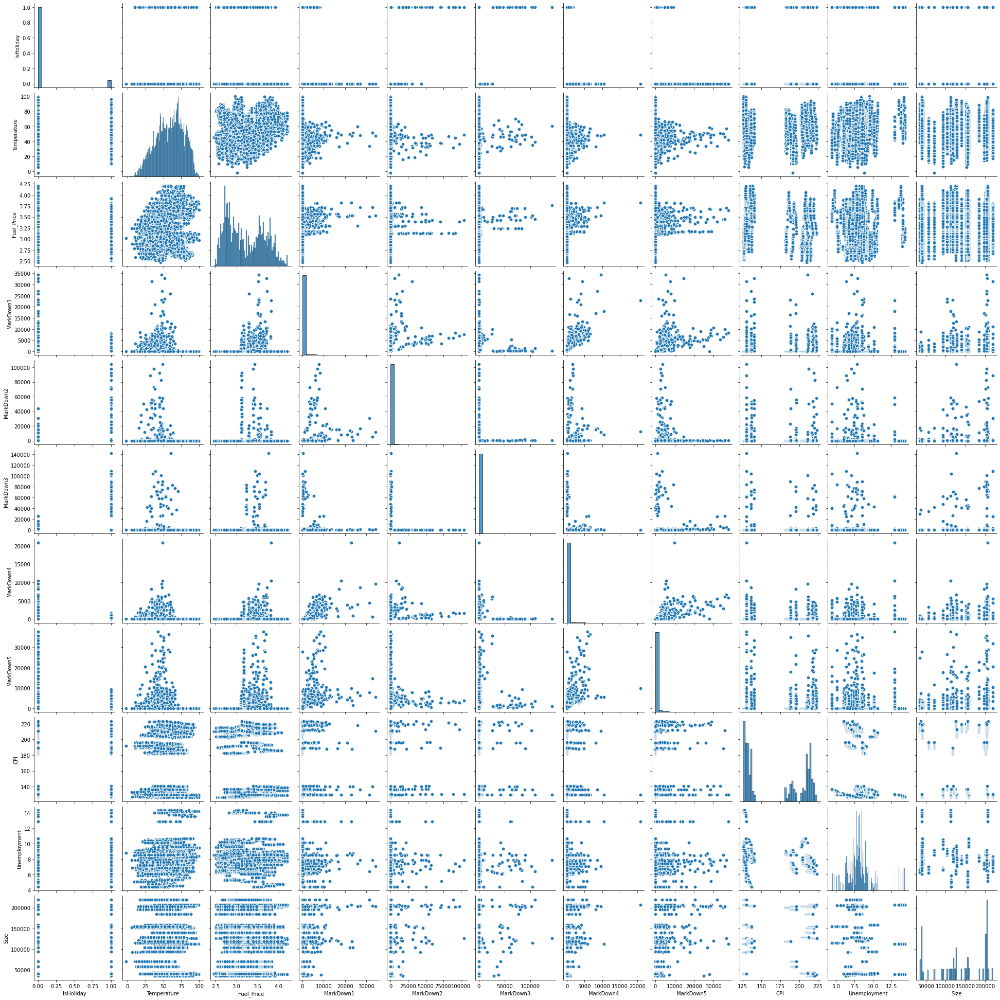

In [45]:
# Pair Plotting

sns.pairplot(train_num)

### Trends

- Average weekly sales by store
- Average weekly sales by department

  Store        Date  Weekly_Sales
0     1  2010-02-05    1643690.90
1     1  2010-02-12    1641957.44
2     1  2010-02-19    1612831.17
3     1  2010-02-26    1409727.59
4     1  2010-03-05    1554806.68
    Store  Weekly_Sales
0       1  1.542039e+06
11      2  1.938904e+06
22      3  3.956343e+05
33      4  2.067737e+06
40      5  3.130725e+05
  Dept        Date  Weekly_Sales
0    1  2010-02-05     881833.41
1    1  2010-02-12    1457182.40
2    1  2010-02-19    1118257.36
3    1  2010-02-26     681391.58
4    1  2010-03-05     762652.57
    Dept  Weekly_Sales
0      1  8.819285e+05
10     2  1.955582e+06
21     3  5.210935e+05
32     4  1.161434e+06
43     5  1.021350e+06


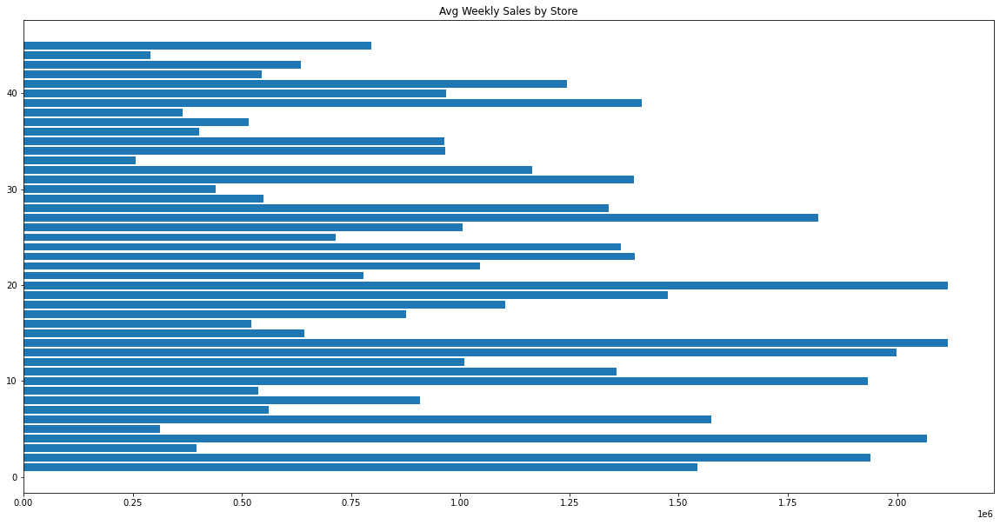

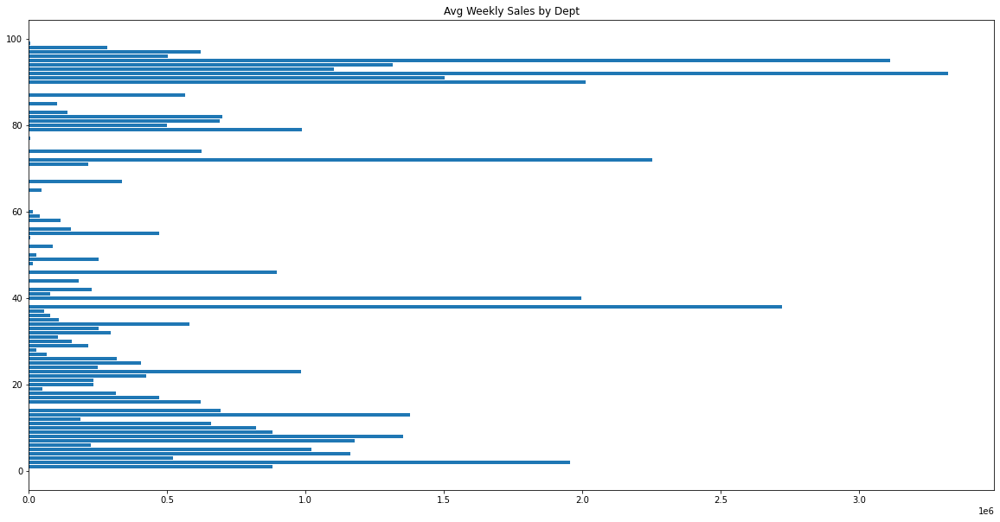

In [46]:
for var in ['Store', 'Dept']:
    agg_temp = combined_data_train.groupby([var, 'Date'], as_index=False).agg({'Weekly_Sales': 'sum'})
    
    print(agg_temp.head())
    
    agg_temp2 = agg_temp.groupby([var], as_index=False).agg({'Weekly_Sales': 'mean'})
    agg_temp2[var] = pd.to_numeric(agg_temp2[var])
    agg_temp2.sort_values(var, inplace=True)
    
    print(agg_temp2.head())
    
    plt.figure(figsize=(20,10))
    plt.title('Avg Weekly Sales by ' + var)
    plt.barh(agg_temp2[var], agg_temp2['Weekly_Sales'])

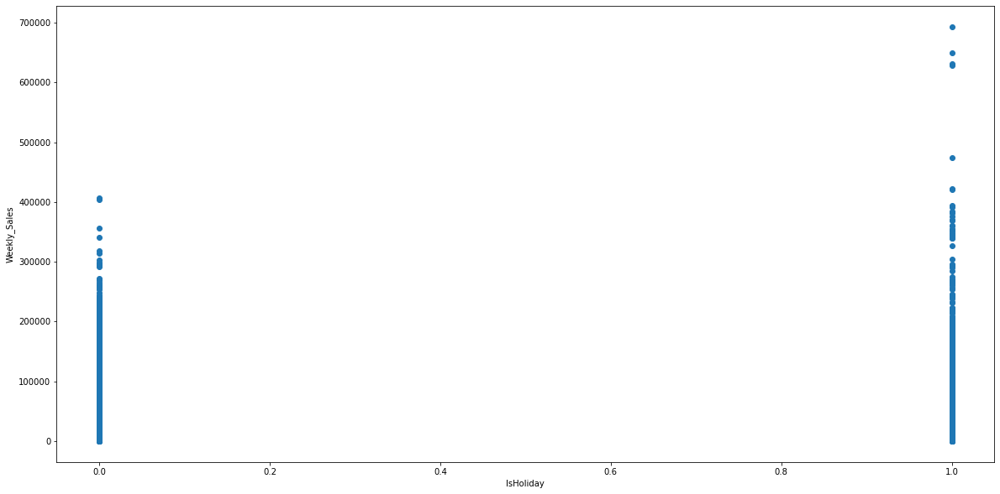

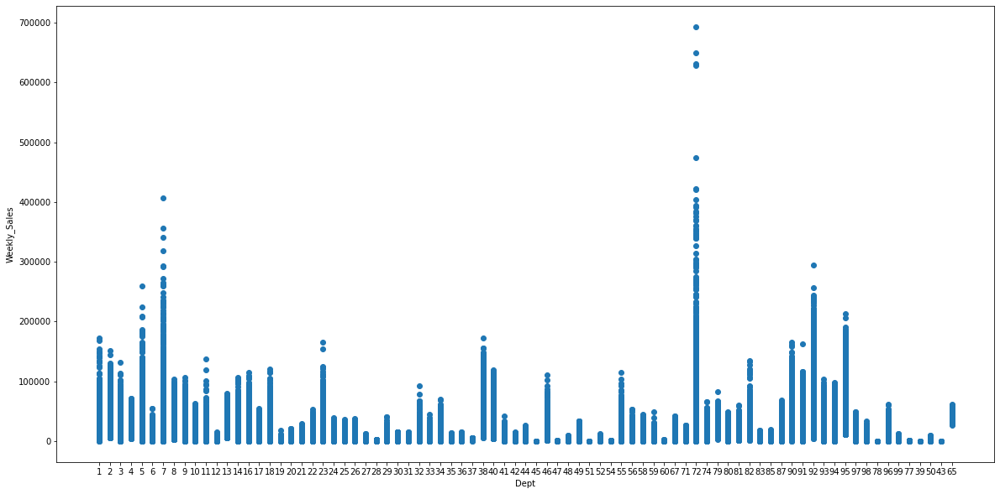

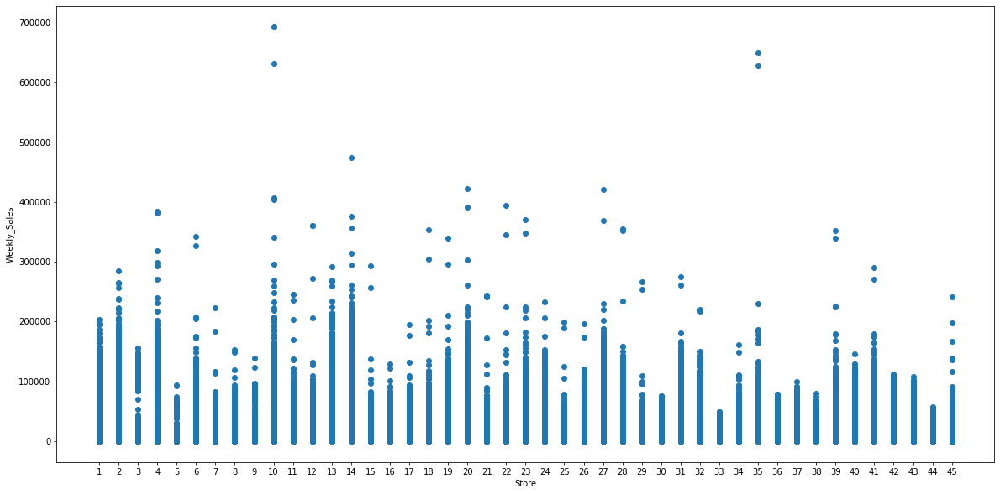

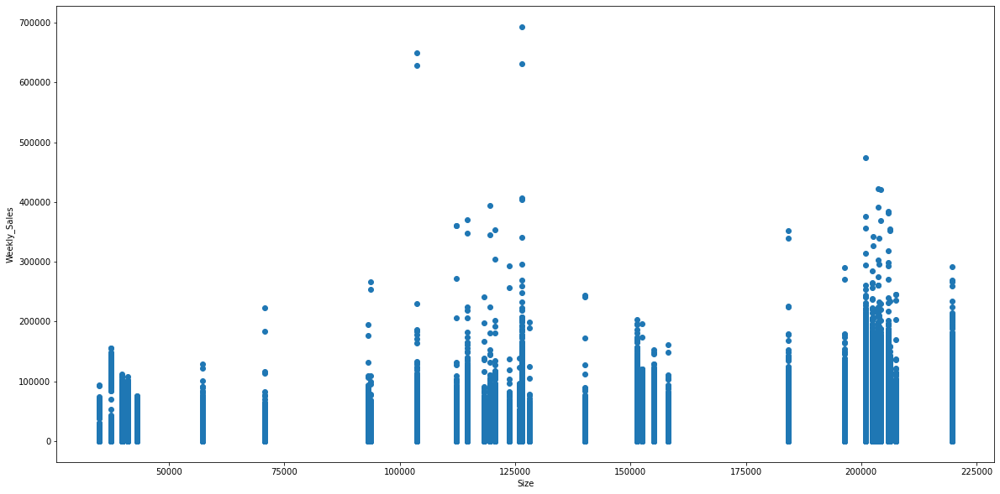

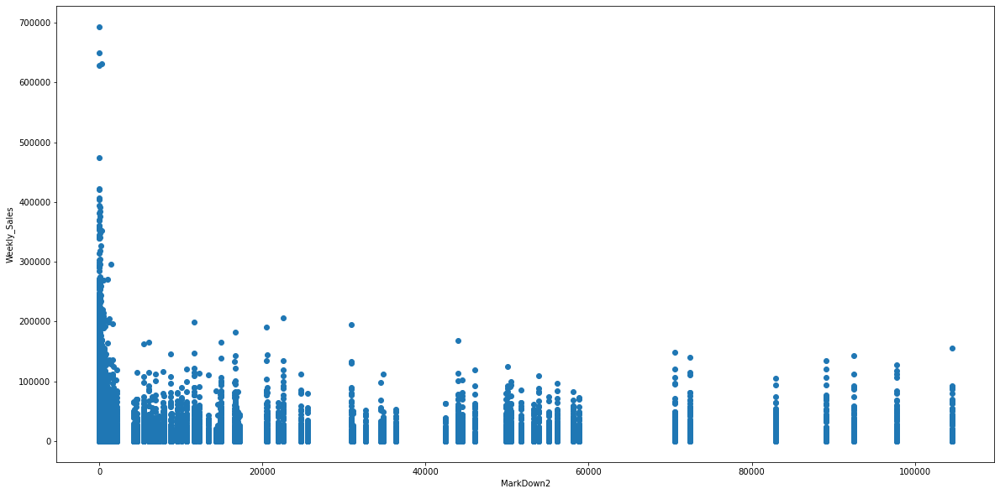

...

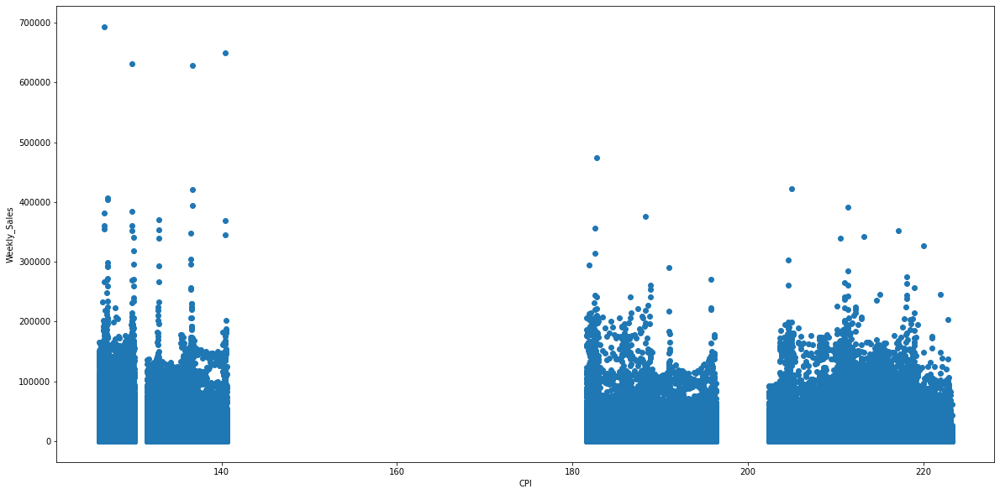

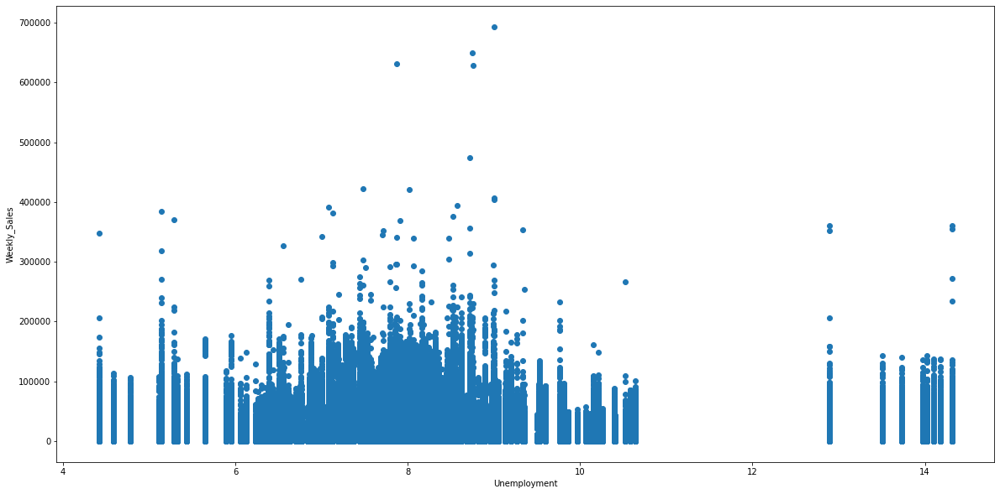

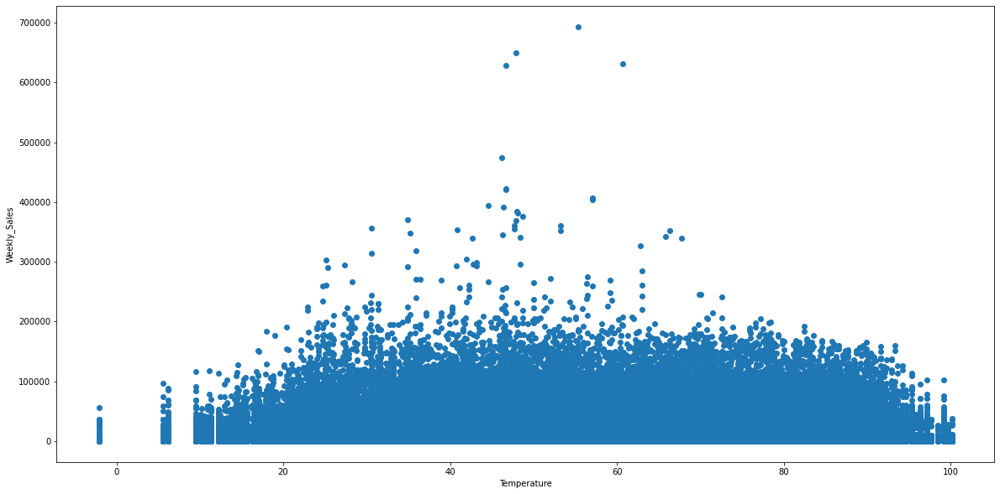

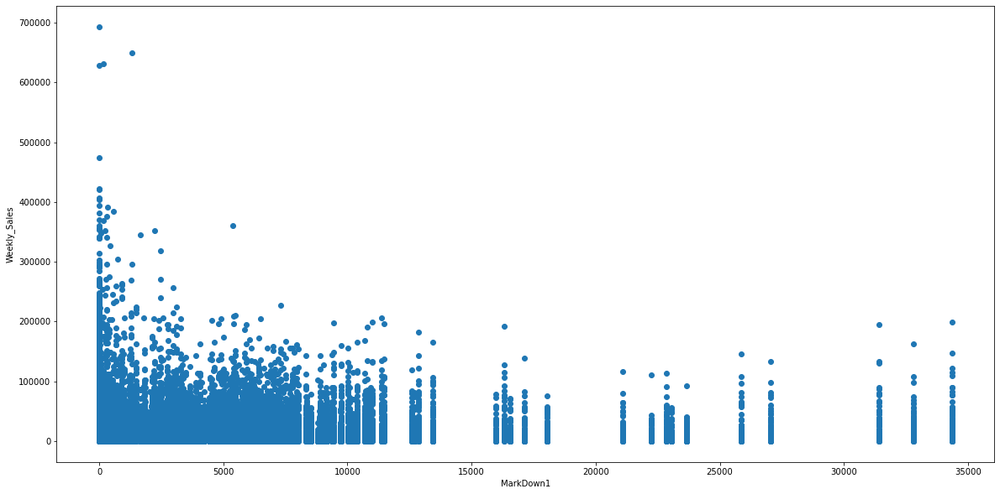

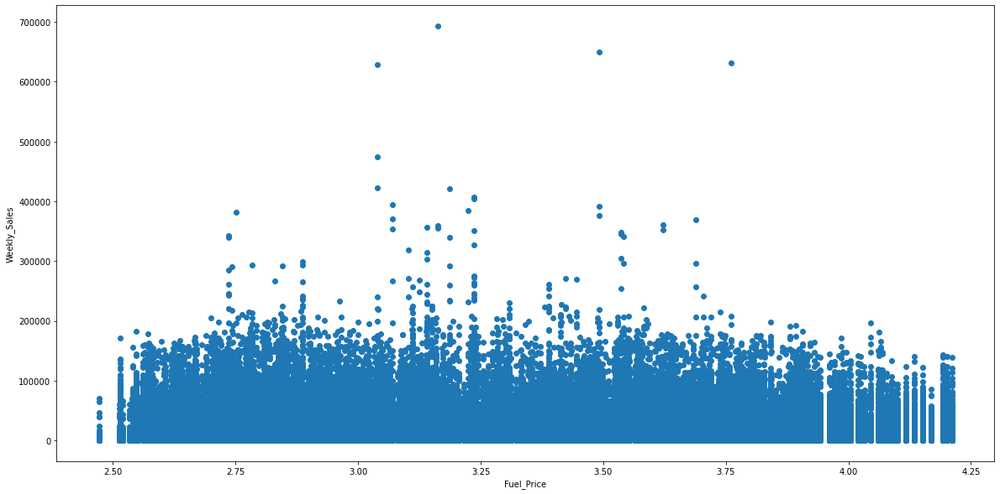

In [47]:
# Using scatter plot to check trends 

var_list = [x for x in combined_data_train.columns]
columnstodrop = ['Weekly_Sales', 'Date']
var_list = list(set(var_list).difference(set(columnstodrop)))

for varname in var_list:
    plt.figure(figsize=(20,10))
    plt.scatter(combined_data_train[varname], combined_data_train['Weekly_Sales'])
    plt.xlabel(varname); plt.ylabel("Weekly_Sales")

In [48]:
all_corr = combined_data_train.corr().unstack().reset_index()
print(all_corr.shape)

corr_table = all_corr[all_corr['level_1'] =='Weekly_Sales' ]
corr_table = corr_table.loc[ (corr_table['level_0'] != 'Weekly_Sales') ]
print(corr_table.shape)

corr_table.columns = ['var1', 'var2', 'corr_value']
corr_table['corr_abs'] = corr_table['corr_value'].abs()
corr_table = corr_table.sort_values(by= ['corr_abs'], ascending = False )
corr_table

(144, 3)
(11, 3)


,var1,var2,corr_value,corr_abs
132,Size,Weekly_Sales,0.242929,0.242929
72,MarkDown3,Weekly_Sales,0.044642,0.044642
96,MarkDown5,Weekly_Sales,0.038685,0.038685
48,MarkDown1,Weekly_Sales,0.035576,0.035576
84,MarkDown4,Weekly_Sales,0.031970,0.031970
120,Unemployment,Weekly_Sales,-0.025631,0.025631
108,CPI,Weekly_Sales,-0.021871,0.021871
60,MarkDown2,Weekly_Sales,0.016028,0.016028
12,IsHoliday,Weekly_Sales,0.013925,0.013925
24,Temperature,Weekly_Sales,-0.007911,0.007911


### Date Trends

In [49]:
combined_data_train['week_number'] = combined_data_train['Date2'].dt.week
combined_data_train['year_number'] = combined_data_train['Date2'].dt.year

combined_data_train.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size,Date2,week_number,year_number
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05,5,2010
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05,5,2010
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05,5,2010
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05,5,2010
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315,2010-02-05,5,2010


In [50]:
# Checking the holiday weeks with highest total sales 

temper = combined_data_train.groupby('Date', as_index=False).agg({'Weekly_Sales':'sum'})
print("Average Sales: ",temper['Weekly_Sales'].mean())

temper = combined_data_train.groupby(['Date', 'IsHoliday', 'week_number', 'year_number'], as_index=False).agg({'Weekly_Sales':'sum'})
temper.loc[temper['IsHoliday'] == 1].sort_values(by = 'Weekly_Sales', ascending=False)

Average Sales:  47371515.068899974


,Date,IsHoliday,week_number,year_number,Weekly_Sales
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
1,2010-02-12,1,6,2010,48336800.10
53,2011-02-11,1,6,2011,47336816.90
83,2011-09-09,1,36,2011,46763760.42
99,2011-12-30,1,52,2011,46044300.91
31,2010-09-10,1,36,2010,45635418.66
47,2010-12-31,1,52,2010,40434740.42


In [51]:
# Checking the weeks with highest total sales
# Note that most of them are non holidays

temper.sort_values(by = 'Weekly_Sales', ascending=False).head(20)

,Date,IsHoliday,week_number,year_number,Weekly_Sales
46,2010-12-24,0,51,2010,80931586.20
98,2011-12-23,0,51,2011,76999773.57
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
45,2010-12-17,0,50,2010,61821317.85
97,2011-12-16,0,50,2011,60086723.16
44,2010-12-10,0,49,2010,55667840.03
96,2011-12-09,0,49,2011,55561557.73
8,2010-04-02,0,13,2010,50424232.22
17,2010-06-04,0,22,2010,50188767.60


<AxesSubplot:title={'center':'Total Juxtaposed Weekly Sales'}, xlabel='week_number', ylabel='Weekly_Sales'>

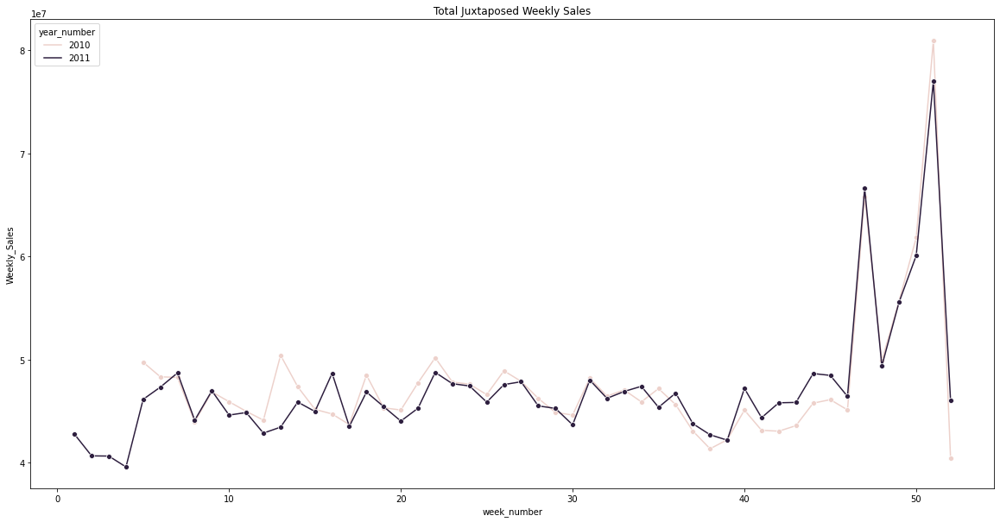

In [52]:
#Checking weekly Sales of different years juxtaposed

another_agg = combined_data_train.groupby(['week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
plt.figure(figsize=(20,10))
plt.title('Total Juxtaposed Weekly Sales')
sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = another_agg, marker = 'o')

          Date2 Store  Weekly_Sales
2075 2010-12-24    14    3818686.45
2082 2010-12-24    20    3766687.43
2071 2010-12-24    10    3749057.69
4443 2011-12-23     4    3676388.98
2074 2010-12-24    13    3595903.20
4414 2011-12-23    13    3556766.03
4422 2011-12-23    20    3555379.47
2103 2010-12-24     4    3526713.39
4411 2011-12-23    10    3487986.89
2081 2010-12-24     2    3436154.68
          Date2 Dept  Weekly_Sales
3301 2010-11-26   72   10533640.92
7292 2011-11-25   72   10089874.40
3605 2010-12-24    7    6490778.39
3607 2010-12-24   72    6020196.03
7606 2011-12-23    7    5535941.35
7608 2011-12-23   72    5028104.79
7623 2011-12-23   92    4647997.52
7307 2011-11-25   92    4330784.59
3620 2010-12-24   92    4203774.33
7543 2011-12-16   92    4093797.82


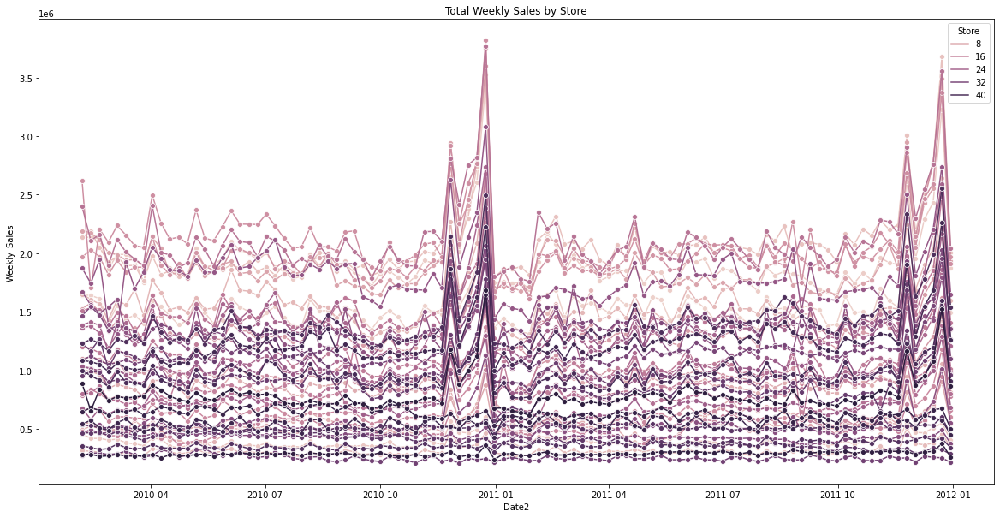

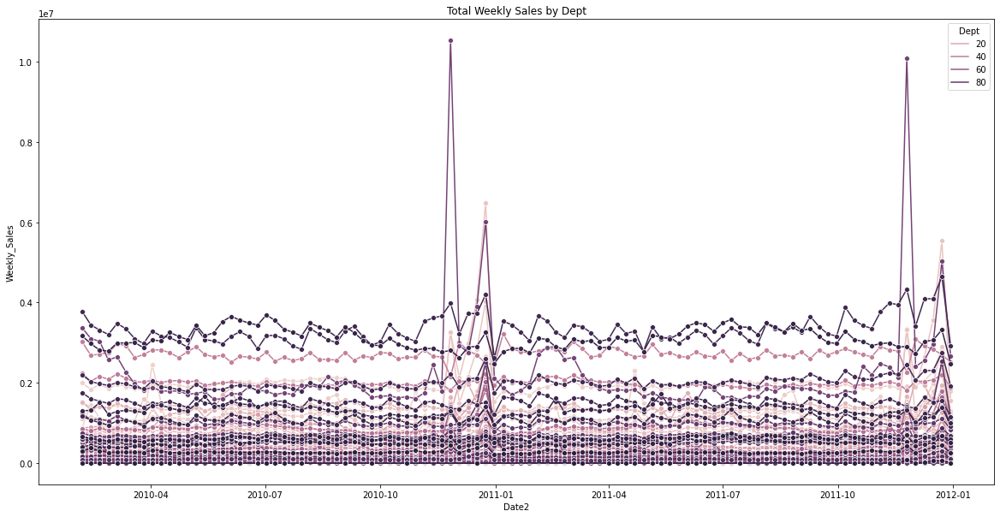

In [53]:
# Checking total weekly Sales of different Stores

for var in ['Store', 'Dept']:
    agg_temp = combined_data_train.groupby(['Date2', var], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    print(agg_temp.sort_values(by='Weekly_Sales', ascending=False).head(10))
    
    plt.figure(figsize=(20,10))
    plt.title('Total Weekly Sales by ' + var)
    agg_temp[var] = pd.to_numeric(agg_temp[var])#The hue variable has to be numerical 
    sns.lineplot(x="Date2", y="Weekly_Sales", hue=var, data = agg_temp, marker = 'o')

(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(7, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(6, 5)
(100, 5)
(100, 5)
(100, 5)
(89, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(98, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(9, 5)
(49, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(

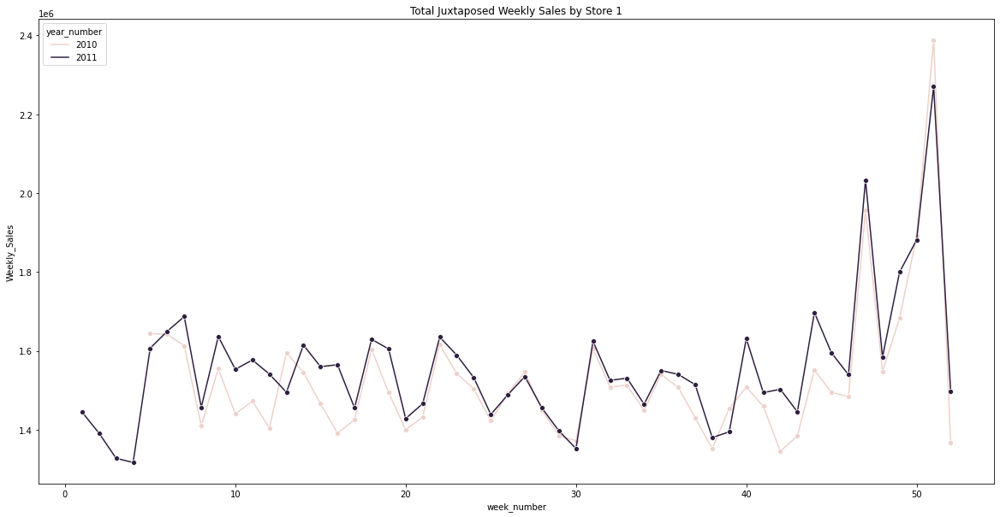

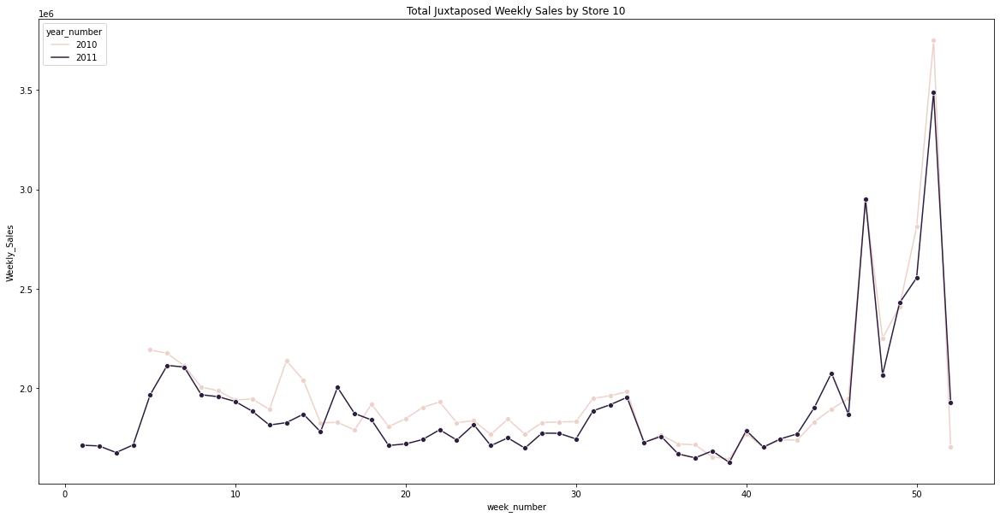

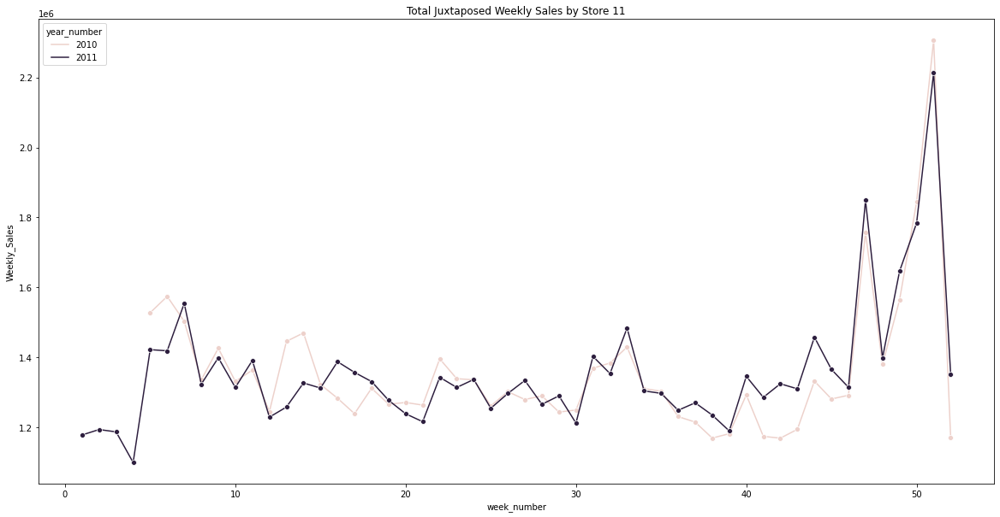

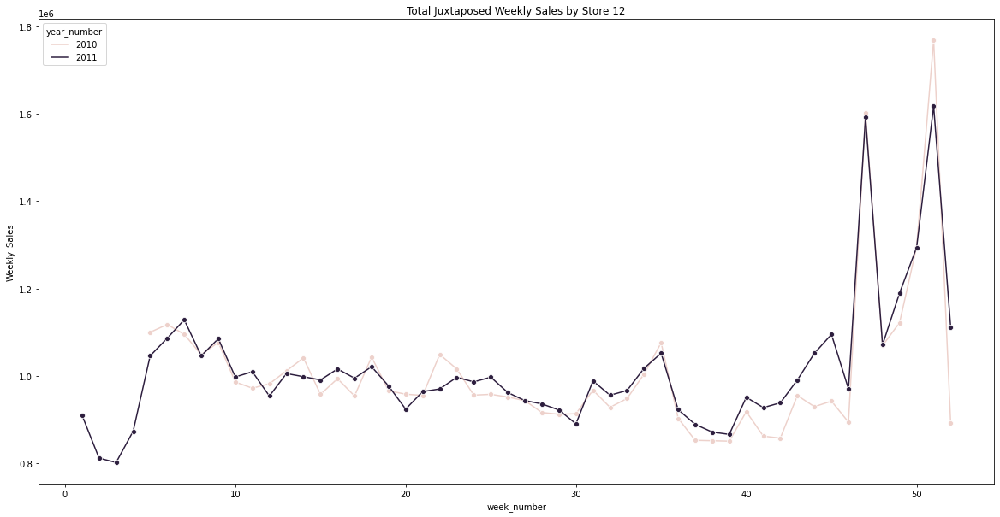

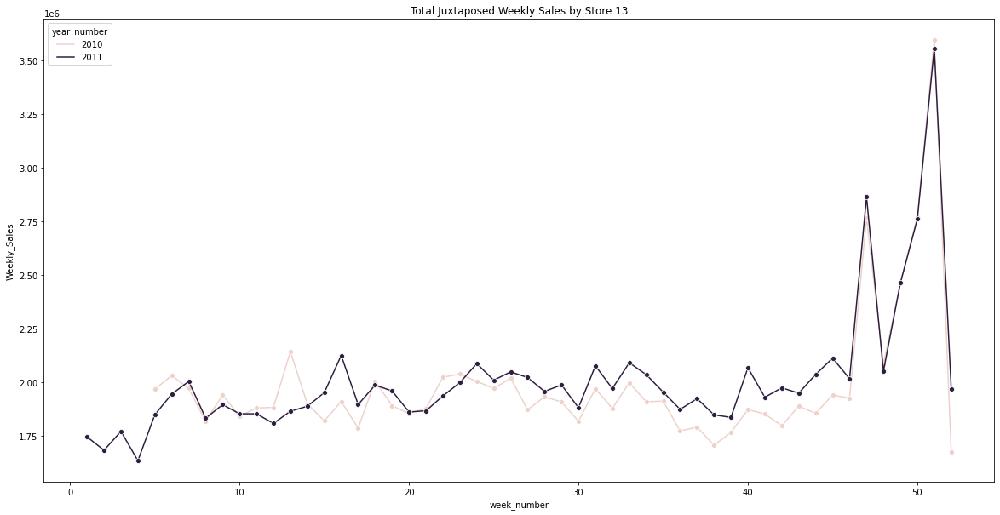

...

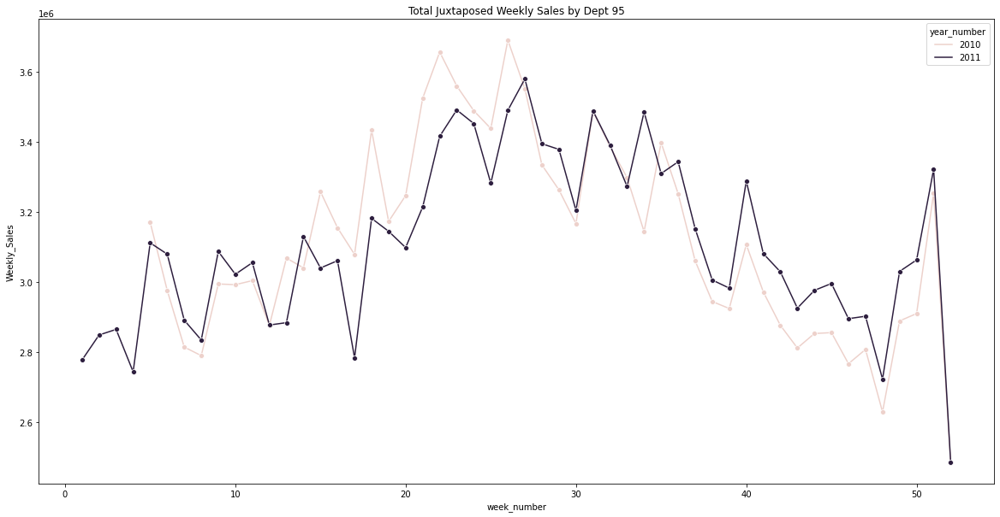

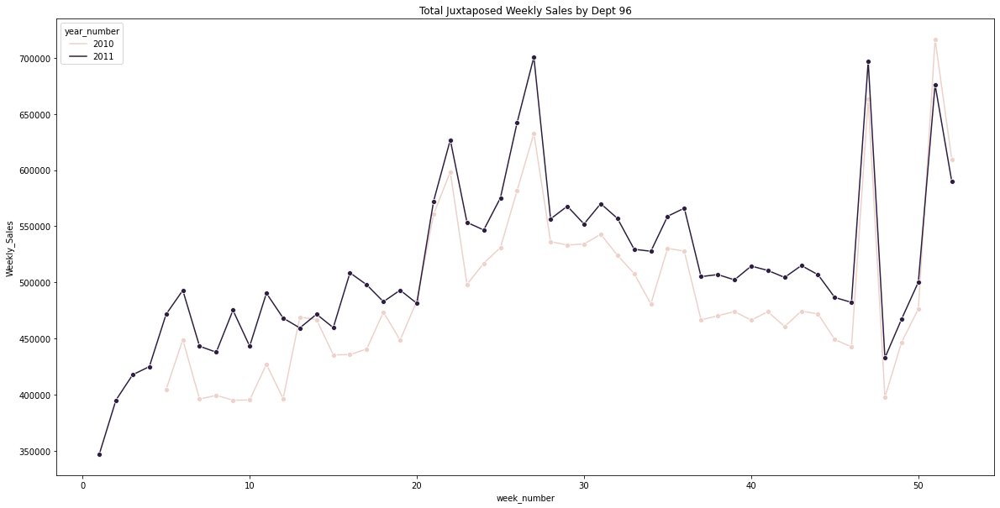

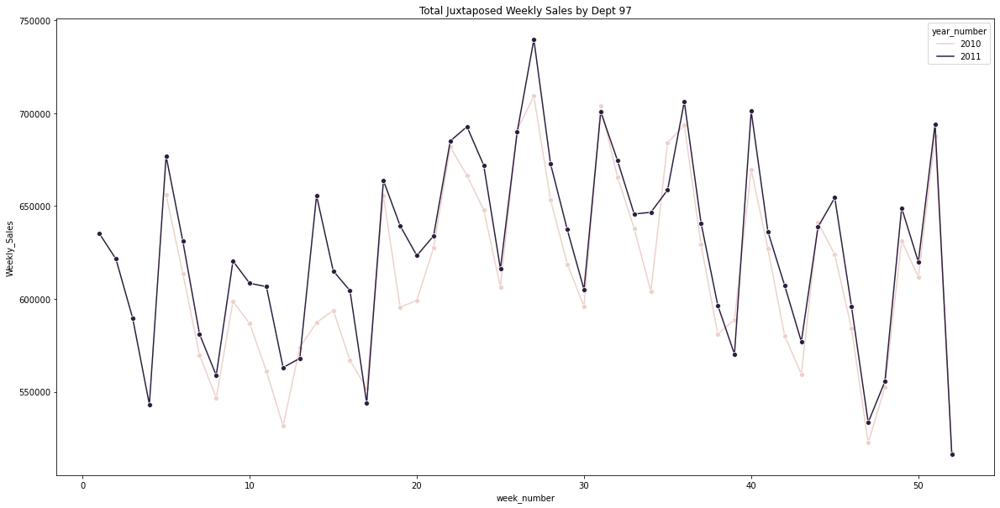

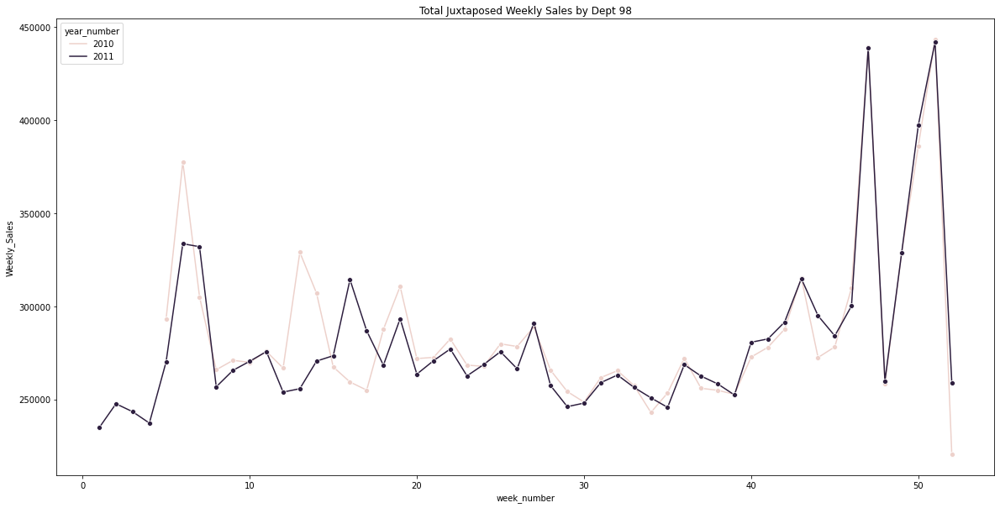

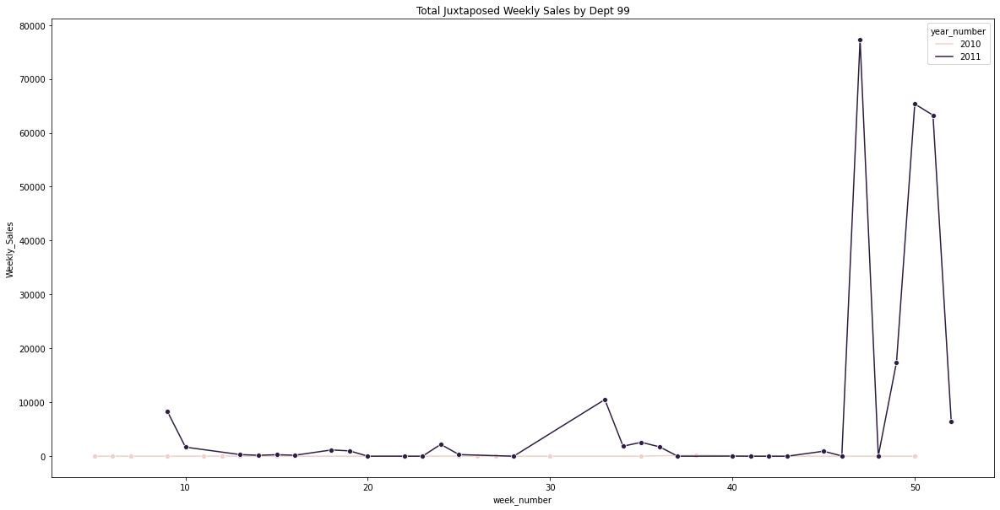

In [54]:
# Checking weekly Sales of different years juxtaposed
# By Store and by Dept

for var in ['Store', 'Dept']:
    another_agg = combined_data_train.groupby([var, 'week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    for idd in another_agg[var].unique() :
        temper = another_agg.loc[ another_agg[var] == idd ]
        print(temper.shape)
   
        plt.figure(figsize=(20,10))
        plt.title('Total Juxtaposed Weekly Sales by ' + var + " " + idd)
        sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = temper, marker = 'o')

### New Feature Creation

In [55]:
# Identifying and marking the holiday names

conditions = [combined_data_train['IsHoliday'] == 0, combined_data_train['week_number'] == 52, combined_data_train['week_number'] == 47, \
             combined_data_train['week_number'] == 36, combined_data_train['week_number'] == 6]
choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
combined_data_train['holiday_type' ] = np.select(conditions, choices, default=np.nan)
combined_data_train['holiday_type'].value_counts()

no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64

In [56]:
# Function block to create sales rush weeks

def season_variables(df):
    df['week_number'] = df['Date2'].dt.week
    df['year_number'] = df['Date2'].dt.year
    conditions = [df['IsHoliday'] == 0, df['week_number'] == 52, df['week_number'] == 47, \
                 df['week_number'] == 36, df['week_number'] == 6]
    choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
    df['holiday_type' ] = np.select(conditions, choices, default=np.nan)
    print(df['holiday_type'].value_counts())
    christmas_df = pd.DataFrame(df[df['holiday_type'] == 'christmas' ]['Date2'].unique())
    christmas_df.columns = ['christmas_week']
    christmas_df['minus1'] = christmas_df['christmas_week'] -  pd.to_timedelta(7, unit='d')
    christmas_df['minus2'] = christmas_df['christmas_week'] -  pd.to_timedelta(14, unit='d')
    christmas_df['minus3'] = christmas_df['christmas_week'] -  pd.to_timedelta(21, unit='d')
    
    # Creating all the 5 binary variables
    df['christmas_week'] = np.where(df['Date2'].isin(list(christmas_df['christmas_week']) ),1,0 )
    df['christmas_minus1'] = np.where(df['Date2'].isin(list(christmas_df['minus1']) ),1,0 )
    df['christmas_minus2'] = np.where(df['Date2'].isin(list(christmas_df['minus2']) ),1,0 )
    df['christmas_minus3'] = np.where(df['Date2'].isin(list(christmas_df['minus3']) ),1,0 )
    df['thanksgiving_week'] = np.where(df['holiday_type'] == 'thanksgiving', 1, 0)
    print(df['christmas_week'].value_counts())
    print(df['christmas_minus1'].value_counts())
    print(df['christmas_minus2'].value_counts())
    print(df['christmas_minus3'].value_counts())
    print(df['thanksgiving_week'].value_counts())
    return df

In [57]:
combined_data_train = season_variables(combined_data_train)
combined_data_train.head(10)

no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64
0    287295
1      5909
Name: christmas_week, dtype: int64
0    287234
1      5970
Name: christmas_minus1, dtype: int64
0    287251
1      5953
Name: christmas_minus2, dtype: int64
0    287266
1      5938
Name: christmas_minus3, dtype: int64
0    287258
1      5946
Name: thanksgiving_week, dtype: int64


,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Size,Date2,week_number,year_number,holiday_type,christmas_week,christmas_minus1,christmas_minus2,christmas_minus3,thanksgiving_week
0,1,1,2010-02-05,24924.50,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
1,1,2,2010-02-05,50605.27,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
2,1,3,2010-02-05,13740.12,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
3,1,4,2010-02-05,39954.04,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
4,1,5,2010-02-05,32229.38,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
5,1,6,2010-02-05,5749.03,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
6,1,7,2010-02-05,21084.08,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
7,1,8,2010-02-05,40129.01,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
8,1,9,2010-02-05,16930.99,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0
9,1,10,2010-02-05,30721.50,0,42.31,2.572,0.0,0.0,0.0,...,151315,2010-02-05,5,2010,no_holiday,0,0,0,0,0


In [58]:
combined_data_test = season_variables(combined_data_test)
combined_data_test.head(10)

no_holiday    121057
super_bowl      2994
labor_day       2957
Name: holiday_type, dtype: int64
0    127008
Name: christmas_week, dtype: int64
0    127008
Name: christmas_minus1, dtype: int64
0    127008
Name: christmas_minus2, dtype: int64
0    127008
Name: christmas_minus3, dtype: int64
0    127008
Name: thanksgiving_week, dtype: int64


,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Size,Date2,week_number,year_number,holiday_type,christmas_week,christmas_minus1,christmas_minus2,christmas_minus3,thanksgiving_week
7157,1,1,2012-01-06,16567.69,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7158,1,2,2012-01-06,44481.38,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7159,1,3,2012-01-06,13926.04,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7160,1,4,2012-01-06,40925.76,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7161,1,5,2012-01-06,23105.81,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7162,1,6,2012-01-06,3665.25,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7163,1,7,2012-01-06,12377.76,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7164,1,8,2012-01-06,36797.00,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7165,1,9,2012-01-06,20705.21,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7166,1,10,2012-01-06,29927.33,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0


In [59]:
# Store and Department Feature

store_dept_median = combined_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Weekly_Sales' :  ['median']})
print(store_dept_median.shape)

store_dept_median.columns = ["_".join(x) for x in store_dept_median.columns.ravel()]
store_dept_median.columns = ['Store', 'Dept', 'Weekly_Sales_median']

print(store_dept_median.head())

(3292, 3)
  Store Dept  Weekly_Sales_median
0     1    1            18988.700
1     1   10            30870.720
2     1   11            23574.725
3     1   12            10607.065
4     1   13            37848.040


In [60]:
# Adding the feature into train and test data sets
print(combined_data_train.shape)
combined_data_train2 = pd.merge(combined_data_train, store_dept_median, on=['Store', 'Dept'], how='left')

print(combined_data_train2.shape)
print(combined_data_test.shape)

combined_data_test2 = pd.merge(combined_data_test, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_test2.shape)

(293204, 25)
(293204, 26)
(127008, 25)
(127008, 26)


In [61]:
combined_data_test.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Size,Date2,week_number,year_number,holiday_type,christmas_week,christmas_minus1,christmas_minus2,christmas_minus3,thanksgiving_week
7157,1,1,2012-01-06,16567.69,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7158,1,2,2012-01-06,44481.38,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7159,1,3,2012-01-06,13926.04,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7160,1,4,2012-01-06,40925.76,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0
7161,1,5,2012-01-06,23105.81,0,49.01,3.157,6277.39,21813.16,143.1,...,151315,2012-01-06,1,2012,no_holiday,0,0,0,0,0


In [62]:
# Filling the few missing values for new feature in test data with Mean

combined_data_test2['Weekly_Sales_median'].fillna(combined_data_test2['Weekly_Sales_median'].mean() , inplace=True)

In [63]:
combined_data_test2.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Date2,week_number,year_number,holiday_type,christmas_week,christmas_minus1,christmas_minus2,christmas_minus3,thanksgiving_week,Weekly_Sales_median
0,1,1,2012-01-06,16567.69,0,49.01,3.157,6277.39,21813.16,143.1,...,2012-01-06,1,2012,no_holiday,0,0,0,0,0,18988.700
1,1,2,2012-01-06,44481.38,0,49.01,3.157,6277.39,21813.16,143.1,...,2012-01-06,1,2012,no_holiday,0,0,0,0,0,45235.020
2,1,3,2012-01-06,13926.04,0,49.01,3.157,6277.39,21813.16,143.1,...,2012-01-06,1,2012,no_holiday,0,0,0,0,0,10141.660
3,1,4,2012-01-06,40925.76,0,49.01,3.157,6277.39,21813.16,143.1,...,2012-01-06,1,2012,no_holiday,0,0,0,0,0,36372.335
4,1,5,2012-01-06,23105.81,0,49.01,3.157,6277.39,21813.16,143.1,...,2012-01-06,1,2012,no_holiday,0,0,0,0,0,21409.925


### Modelling

- Prediction 1 (Store, Department and Week)

In [64]:
# Prediction based on Store, Dept and Week
# Assigning prediction_type label as '1' to this combination
# Mean amount is assigned in the predicted column

simple_prediction = combined_data_train.groupby(['Store', 'Dept', 'week_number'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(simple_prediction.shape)
simple_prediction.columns = ["_".join(x) for x in simple_prediction.columns.ravel()]
simple_prediction = simple_prediction.drop(['Weekly_Sales_count'], axis=1)
simple_prediction.columns = ['Store', 'Dept', 'week_number', 'Sales_prediction']
simple_prediction['prediction_type'] = 1
simple_prediction.head()

(155979, 5)


,Store,Dept,week_number,Sales_prediction,prediction_type
0,1,1,1,15984.24,1
1,1,1,2,17359.70,1
2,1,1,3,17341.47,1
3,1,1,4,18461.18,1
4,1,1,5,23295.13,1


In [65]:
## Merging with previous dataframe

pd.merge(combined_data_test, simple_prediction, on = ['Store', 'Dept', 'week_number']).shape

(124366, 27)

### Modelling

- Prediction 2 (Department)

In [66]:
# Prediction based on Department
# Assigning prediction_type label as '2' to this combination
# Mean amount is assigned in the predicted column

moresimple_prediction = combined_data_train.groupby(['Dept'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(moresimple_prediction.shape)
moresimple_prediction.columns = ["_".join(x) for x in moresimple_prediction.columns.ravel()]
print(moresimple_prediction['Weekly_Sales_count'].describe())
moresimple_prediction.head()
moresimple_prediction = moresimple_prediction.drop(['Weekly_Sales_count'], axis=1)
moresimple_prediction.columns = ['Dept', 'Sales_prediction']
moresimple_prediction['prediction_type'] = 2
moresimple_prediction.head()

(81, 3)
count      81.000000
mean     3619.802469
std      1331.333180
min         6.000000
25%      3705.000000
50%      4115.000000
75%      4500.000000
max      4500.000000
Name: Weekly_Sales_count, dtype: float64


,Dept,Sales_prediction,prediction_type
0,1,19598.410840,2
1,10,18246.069967,2
2,11,14668.411385,2
3,12,4151.166962,2
4,13,30624.612680,2


In [67]:
def score_direct(df_to_score, pred_df1, pred_df2):
    
    """
    We will use the 2 set of previous predictions to estimate sales on the test data 

    """
    df_to_score['week_number'] =  df_to_score['Date2'].dt.week
    df_input = df_to_score[['Store', 'Dept', 'Date2',  'week_number']]
    print(df_input.shape)
    
    # Checking if there is only 1 entry per combination being used to predict (i.e. Store, Dept, Week Number)
    print( df_input.groupby(['Store', 'Dept', 'week_number']).size().shape )
    
    # Using prediction1 and separate out combinations that remain unscored
    df_scored = pd.merge(df_input, pred_df1, on= ['Store', 'Dept', 'week_number'], how='left')
    df_present = df_scored[ pd.isnull(df_scored['prediction_type']) ==False ]
    df_missed =  df_scored[ pd.isnull(df_scored['prediction_type']) ]
    df_missed = df_missed.drop(['Sales_prediction', 'prediction_type'], axis=1)
    
    # Using prediction2 to score the unscored test data
    df_missed_scored = pd.merge(df_missed, pred_df2, on= ['Dept'], how='left')
    print(df_missed_scored['prediction_type'].isna().sum())    
    
    # Getting the scored test data in single DF
    df_full_scored = pd.concat( [df_present, df_missed_scored ] , axis=0)
    print(df_full_scored.shape)
    print(df_full_scored['prediction_type'].value_counts() )
    
    return (df_full_scored)

In [68]:
## First prediction1 is used for scoring followed by prediction2 for the unscored remaining ones
test_full_scored = score_direct(combined_data_test, simple_prediction, moresimple_prediction)

test_full_scored

(127008, 4)
(127008,)
0
(127008, 6)
1.0    124366
2.0      2642
Name: prediction_type, dtype: int64


,Store,Dept,Date2,week_number,Sales_prediction,prediction_type
0,1,1,2012-01-06,1,15984.240000,1.0
1,1,2,2012-01-06,1,43202.290000,1.0
2,1,3,2012-01-06,1,15808.150000,1.0
3,1,4,2012-01-06,1,37947.800000,1.0
4,1,5,2012-01-06,1,22699.690000,1.0
...,...,...,...,...,...,...
2637,45,47,2012-08-03,31,126.461307,2.0
2638,45,18,2012-08-17,33,9317.080835,2.0
2639,45,45,2012-09-07,36,23.567669,2.0
2640,45,47,2012-09-07,36,126.461307,2.0


### Modelling

- Random Forest Regression

In [69]:
# Doing this for one of the categorical variables 

cat_columns = ['Type']
combined_data_train2 = pd.concat([combined_data_train2, pd.get_dummies(combined_data_train2[cat_columns], drop_first=True)], axis=1)
combined_data_test2 = pd.concat([combined_data_test2, pd.get_dummies(combined_data_test2[cat_columns], drop_first=True)], axis=1)

In [70]:
for col in combined_data_train2:
    print(col)


Store
Dept
Date
Weekly_Sales
IsHoliday
Temperature
Fuel_Price
MarkDown1
MarkDown2
MarkDown3
MarkDown4
MarkDown5
CPI
Unemployment
Type
Size
Date2
week_number
year_number
holiday_type
christmas_week
christmas_minus1
christmas_minus2
christmas_minus3
thanksgiving_week
Weekly_Sales_median
Type_B
Type_C


In [71]:
columnstodrop = ['Type' , 'Store', 'Dept', 'Date', 'Date2', 'Weekly_Sales', 'holiday_type', 'week_number', 'year_number']
X_train = combined_data_train2.drop(columnstodrop, axis = 1 )
X_test = combined_data_test2.drop(columnstodrop, axis = 1 )
print(X_train.shape)
print(X_test.shape)

(293204, 19)
(127008, 19)


In [72]:
# MarkDown4 and MarkDown5 are found to be over 60% correlated to other markdown variables

X_train = X_train.drop(['MarkDown4', 'MarkDown5'], axis = 1 )
X_test = X_test.drop(['MarkDown4', 'MarkDown5'], axis = 1 )

In [73]:
# Creatin Y dataframes, variable to predict is weekly sales

Y_train = combined_data_train2['Weekly_Sales']
Y_test = combined_data_test2['Weekly_Sales']

In [74]:
## Importing necessary libraries

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [75]:
## Implementing random forest regressor with hyper parameter tuning
## Criterion = 'mse'

import time
aa = time.time()

rfr = RandomForestRegressor(random_state=42,  n_jobs = -1, max_depth = 5)
param_grid = { 
'n_estimators': [50, 100, 200]
}
CV_rfr = GridSearchCV(estimator = rfr, param_grid=param_grid, cv= 3)
CV_rfr.fit(X_train, Y_train)
rfr_best = CV_rfr.best_estimator_

print(rfr_best)
print(time.time() - aa)

RandomForestRegressor(max_depth=5, n_estimators=200, n_jobs=-1, random_state=42)
114.30143880844116


In [76]:
## Function to get feature importance score for all columns

def get_FI(modelname, dfname):
    importance_list = pd.DataFrame(modelname.feature_importances_, columns=['importance'])
    varnames_list = pd.DataFrame(dfname.columns.tolist(), columns=['feature'])
    #feature_importance = pd.concat([varnames_list, importance_list], axis=1, join_axes=[varnames_list.index])
    
    feature_importance = pd.concat([varnames_list, importance_list], axis=1)
    feature_importance = feature_importance.sort_values(by=['importance'], ascending=False)
    feature_importance['cum_importance'] = feature_importance['importance'].cumsum()
    
    return feature_importance

In [77]:
## Getting feature importance score in descending order of importance
get_FI(rfr_best, X_train)

,feature,importance,cum_importance
14,Weekly_Sales_median,9.887667e-01,0.988767
10,christmas_minus1,6.642961e-03,0.995410
5,MarkDown3,2.713246e-03,0.998123
13,thanksgiving_week,1.440787e-03,0.999564
8,Size,2.606776e-04,0.999824
15,Type_B,7.955870e-05,0.999904
7,Unemployment,6.226944e-05,0.999966
1,Temperature,1.766254e-05,0.999984
3,MarkDown1,1.042452e-05,0.999994
6,CPI,5.580825e-06,1.000000


### Modelling

- ARIMA (Autoregressive integrated moving average)
- Time Series modelling technique

In [78]:
# Taking an example randomly to showcase ARIMA
# particular_data = sales_data2.loc[(sales_data2['Store'] == '13') & (sales_data2['Dept'] == '17'), \
#                                           ['Date', 'Weekly_Sales']   ]

particular_data = sales_data2.loc[(sales_data2['Store'] == '13') & (sales_data2['Dept'] == '17'),
                                  ['Date', 'Weekly_Sales'] ]


particular_data['Date'] =  pd.to_datetime(particular_data['Date'])
particular_data.index = particular_data.Date
particular_data = particular_data.drop('Date', axis=1)
particular_data.head()

,Weekly_Sales
Date,
2010-02-05,22419.66
2010-02-12,21524.01
2010-02-19,23997.80
2010-02-26,22936.01
2010-03-05,21831.50


In [79]:
particular_data_train, particular_data_test  = particular_data[particular_data.index <= split_date],  particular_data[particular_data.index > split_date]
print(particular_data_train.shape)
print(particular_data_test.shape)

(100, 1)
(43, 1)


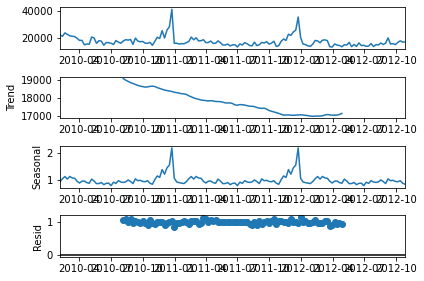

In [80]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(particular_data, model='multiplicative')

fig = result.plot()

In [81]:
from pandas.plotting import autocorrelation_plot

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

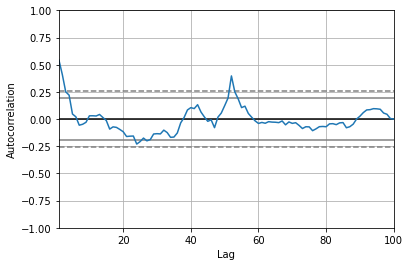

In [82]:
autocorrelation_plot(particular_data_train)

                               SARIMAX Results                                
Dep. Variable:           Weekly_Sales   No. Observations:                  100
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -959.407
Date:                Mon, 18 Apr 2022   AIC                           1920.813
Time:                        14:49:30   BIC                           1923.408
Sample:                    02-05-2010   HQIC                          1921.863
                         - 12-30-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.516e+07   6.77e+05     22.375      0.000    1.38e+07    1.65e+07
Ljung-Box (L1) (Q):                  14.55   Jarque-Bera (JB):              1415.18
Prob(Q):                              0.00   Pr

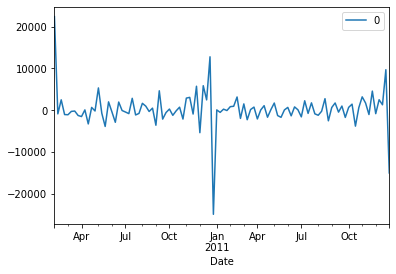

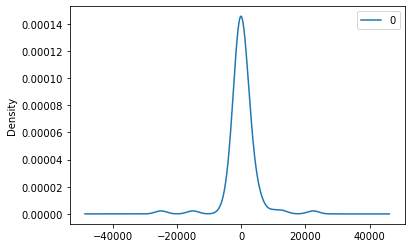

                  0
count    100.000000
mean     206.070400
std     4510.473031
min   -24984.130000
25%    -1117.455000
50%       45.340000
75%     1529.545000
max    22419.660000


In [91]:
# Running ARIMA model
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm

model = sm.tsa.arima.ARIMA(particular_data_train, order=(0,1,0))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

In [ ]:
pip install pmdarima

In [92]:
# Hyper Parameter Tuning of ARIMA model..No seasonality taken.

from pmdarima import auto_arima
auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,
                           max_p=3, max_q=3, m=1,
                           start_P=0, seasonal=False,
                           D=None, trace=True,
                           error_action='ignore'
                           )#suppress_warnings=True
auto_model.fit(particular_data_train)
print(auto_model)
test_arima = auto_model.predict(n_periods= len(particular_data_test))



Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1926.145, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2255.538, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1944.558, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2192.542, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1927.869, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1928.393, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2083.681, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1928.596, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1917.784, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1931.343, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1918.348, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1918.023, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1919.181, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : 

In [93]:
sales_data_train = combined_data_train[['Store', 'Dept', 'Date2', 'Weekly_Sales']]
sales_data_test = combined_data_test[['Store', 'Dept', 'Date2', 'Weekly_Sales']]

In [94]:
# Checking the number of records for each store, dept combination

temper = sales_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2': 'count' })
temper = temper.rename(columns= {'Date2' : 'counter'})
temper.head()

,Store,Dept,counter
0,1,1,100
1,1,10,100
2,1,11,100
3,1,12,100
4,1,13,100


In [95]:
temper2 = temper.groupby(['counter'], as_index=False).agg({'Store': 'count' })
temper2

,counter,Store
0,1,40
1,2,40
2,3,21
3,4,29
4,5,14
...,...,...
93,96,6
94,97,9
95,98,23
96,99,31


In [96]:
temper.shape

(3292, 3)

In [97]:
from sklearn.metrics import mean_absolute_error

In [98]:
def arima_modeler(df_train, df_test):
    
    """
    Now we will create a function to create these models after hyper-parameter tuning 
    for all the combinations of Store and Department in the data    
    """
    combos_train = df_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' : {'min', 'max', 'count'} })
    print(combos_train.shape)
    
    combos_test = df_test.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' :  'count' })
    combos_test = combos_test[['Store', 'Dept']]
    print(combos_test.shape)
    
    combos_common = pd.merge(combos_train, combos_test, on = ['Store', 'Dept'])
    print(combos_common.shape)
    
    combos_common.columns = ["_".join(x) for x in combos_common.columns.ravel()]
    combos_common = combos_common.rename(columns = {'Store_' : 'Store', 'Dept_' : 'Dept'})
    combos_common['total_weeks'] = (combos_common['Date2_max'] - combos_common['Date2_min']).astype('timedelta64[D]')/7 + 1
    combos_common['date_gap'] = combos_common['total_weeks'] - combos_common['Date2_count']
    combos_common_nogap = combos_common.loc[combos_common['date_gap'] ==0 ]
    print(combos_common_nogap.shape)
    
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_max'] == split_date ]
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_count'] == 100 ]
    combos_common_nogap = combos_common_nogap.sort_values(by=['Store', 'Dept'])
    combos_common_nogap.reset_index(inplace=True)
    print(combos_common_nogap.shape)
    print(combos_common_nogap.head(10))
    
    sales_data_train_nogap = pd.merge(df_train, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_train_nogap.shape)
    sales_data_test_nogap = pd.merge(df_test, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_test_nogap.shape)#The remaining data cant be predicted

    sales_data_train_nogap = sales_data_train_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
    sales_data_test_nogap = sales_data_test_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
#     sales_data_test_nogap = sales_data_test_nogap[0:10000]
    
    #creating a DF that will store all the model outputs
    all_scores = pd.DataFrame(columns = ['score'])

    for i in range(len(combos_common_nogap)):#
        print(i)
        store_id = combos_common_nogap.loc[i]['Store']
        dept_id = combos_common_nogap.loc[i]['Dept']    
        print("Now the model for Store " + store_id + " and Dept " + dept_id + " will be created")
        particular_data_train = sales_data_train_nogap.loc[(sales_data_train_nogap['Store'] == store_id) & (sales_data_train_nogap['Dept'] == dept_id), \
                                              ['Date2', 'Weekly_Sales']   ]
        print(particular_data_train.shape)
        particular_data_test = sales_data_test_nogap.loc[(sales_data_test_nogap['Store'] == store_id) & (sales_data_test_nogap['Dept'] == dept_id), \
                                                  ['Date2', 'Weekly_Sales']   ]#, 'Weekly_Sales'
        print(particular_data_test.shape)
        #The date is required as index for ARIMA models
        particular_data_train.index = particular_data_train.Date2
        particular_data_test.index = particular_data_test.Date2

        particular_data_train = particular_data_train.drop('Date2', axis=1)
        particular_data_test = particular_data_test.drop('Date2', axis=1)
        
        #Hyper Parameter tuning
        auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,max_p=3, max_q=3, start_P=0, trace=True)
        auto_model.fit(particular_data_train)
        print(auto_model)
        test_arima = auto_model.predict(n_periods=len(particular_data_test))
        test_arima_df  = pd.DataFrame(test_arima, columns = ['score'] )
        #appending the new scores along with the scores already obtained
        all_scores = pd.concat([all_scores, test_arima_df], axis=0)
        all_scores = all_scores.reset_index()
        all_scores = all_scores.drop(['index'], axis=1)
        print(mean_absolute_error(particular_data_test, test_arima))
    
    #getting the model scores and actuals in one file for comparison
    sales_data_test2 = sales_data_test_nogap.reset_index()
    sales_data_test2 = sales_data_test2.drop(['index'], axis=1)
    print(sales_data_test2.head())
    test_data_scored = pd.concat([sales_data_test2, all_scores], axis=1)
    
    return test_data_scored

In [99]:
partialtest_scored_arima = arima_modeler(sales_data_train, sales_data_test)

(3292, 5)
(3196, 2)
(3165, 5)
(2704, 7)
(2654, 8)
   index Store Dept  Date2_count  Date2_min  Date2_max  total_weeks  date_gap
0      0     1    1          100 2010-02-05 2011-12-30        100.0       0.0
1      1     1   10          100 2010-02-05 2011-12-30        100.0       0.0
2      2     1   11          100 2010-02-05 2011-12-30        100.0       0.0
3      3     1   12          100 2010-02-05 2011-12-30        100.0       0.0
4      4     1   13          100 2010-02-05 2011-12-30        100.0       0.0
5      5     1   14          100 2010-02-05 2011-12-30        100.0       0.0
6      6     1   16          100 2010-02-05 2011-12-30        100.0       0.0
7      7     1   17          100 2010-02-05 2011-12-30        100.0       0.0
8      9     1   19          100 2010-02-05 2011-12-30        100.0       0.0
9     10     1    2          100 2010-02-05 2011-12-30        100.0       0.0
(265400, 4)
(114020, 4)
0
Now the model for Store 1 and Dept 1 will be created
(100, 2)
(43,

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1436.443, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.410 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
324.99062233344426
9
Now the model for Store 1 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1929.759, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1926.856, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1927.540, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1927.776, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2433.251, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.103 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
2249.8473511627903
10
Now the model for Store 1 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1622.669,

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1263.681, Time=0.20 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1269.229, Time=0.15 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1266.469, Time=0.23 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1270.849, Time=0.18 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1265.960, Time=0.13 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 1.633 seconds
 ARIMA(3,0,2)(0,0,0)[0] intercept
274.0379886112615
19
Now the model for Store 1 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1740.954, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1780.757, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1739.545, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1754.599, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1995.841, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1740.195, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] inte

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1458.359, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.281 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
309.6785532906391
29
Now the model for Store 1 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2188.538, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2194.301, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2186.650, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2187.951, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2549.346, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2188.558, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2190.534, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2226.544, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.157 seconds
 ARIMA(1,0,0)(0,0,0)[0

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1572.848, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1570.942, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1572.733, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1574.732, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1586.852, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.257 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
664.9847803807808
39
Now the model for Store 1 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2007.393, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2055.600, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2007.414, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2028.753, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2215.267, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2009.307, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] inte

 ARIMA(1,0,0)(0,0,0)[0] intercept
10188.568193618978
49
Now the model for Store 1 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1813.550, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1822.990, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1811.772, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1815.257, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2160.459, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1813.180, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1815.119, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1851.502, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.136 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1677.5176392766368
50
Now the model for Store 1 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.0

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2073.056, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2082.794, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2545.183, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2069.330, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2068.724, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2079.967, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2071.339, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2059.358, Time=0.18 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2048.807, Time=0.12 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2065.532, Time=0.06 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=2047.950, Time=0.17 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2057.643, Time=0.11 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=2050.999, Time=0.21 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 1.092 seconds
 ARIMA(3,0,3)(0,0,0)[0] intercept
4736.545736916399
60
Now the mo

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1920.829, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1922.765, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1924.785, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.306 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3772.848326521528
69
Now the model for Store 10 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1994.900, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2024.404, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1994.596, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2008.019, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2372.136, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1993.488, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1994.731, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercep

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1805.896, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1807.089, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1807.873, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.295 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1446.832717545998
78
Now the model for Store 10 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1788.015, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1808.832, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1786.614, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1793.557, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2131.458, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1787.515, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1789.535, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]         

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1932.753, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1934.670, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1946.026, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.223 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1927.64993833193
87
Now the model for Store 10 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2109.482, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2283.901, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2134.081, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2183.342, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2398.140, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2110.099, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2111.283, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2194.964, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] inter

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.279 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
446.02846331074153
96
Now the model for Store 10 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2121.187, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2128.766, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2121.975, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2124.334, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2558.493, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2121.475, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2115.632, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2124.601, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2115.237, Time=0.10 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2107.218, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[0] interce

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2365.162, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2368.951, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2361.741, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2363.566, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2365.501, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2373.839, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.277 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
19700.805725130373
106
Now the model for Store 10 and Dept 50 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1543.217, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1538.752, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1540.548, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1540.622, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1954.242, Time=0.01 sec

Best model:  ARIMA(0,0,0

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1884.787, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2218.889, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1870.604, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1872.555, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1867.851, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1869.802, Time=0.15 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1869.748, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1873.283, Time=0.08 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1871.506, Time=0.25 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1879.744, Time=0.05 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.934 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
2630.4315137976255
116
Now the model for Store 10 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2557.422, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] i

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1647.797, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1647.926, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1649.821, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1666.402, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.340 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
323.8443804706608
125
Now the model for Store 10 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1821.767, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1866.347, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1833.191, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1850.466, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2288.649, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1820.202, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1819.744, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] in

 ARIMA(0,0,2)(0,0,0)[0] intercept
361.6158042092234
134
Now the model for Store 11 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2091.903, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2128.637, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2098.721, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2089.015, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2279.317, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2089.731, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2090.993, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2184.442, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.164 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
4647.735599455266
135
Now the model for Store 11 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1849.894, Ti

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1741.884, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2115.877, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1738.098, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1736.300, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1737.584, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1739.582, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.253 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1508.093628345792
144
Now the model for Store 11 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1723.955, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1744.928, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1722.117, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1728.841, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]        

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2044.785, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2057.103, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2044.499, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2045.883, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2051.852, Time=0.02 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.325 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
7580.17142831731
154
Now the model for Store 11 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1635.714, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1704.705, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1635.304, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1665.156, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2055.413, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1635.174, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] int

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1806.249, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1808.078, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1806.757, Time=0.17 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.595 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1882.2199525101562
164
Now the model for Store 11 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1872.603, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1905.790, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1874.941, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1890.637, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2460.593, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1865.851, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1864.961, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] interc

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1790.523, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1792.100, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1792.460, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1793.987, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1793.185, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.262 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2060.9774657567236
174
Now the model for Store 11 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1801.960, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1833.100, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1805.643, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1817.189, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1959.932, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1802.897, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1861.909, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1863.906, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.233 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1881.3680272200788
184
Now the model for Store 11 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1663.417, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1690.266, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1661.591, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1664.456, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2180.527, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1663.153, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1665.567, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0

 ARIMA(1,0,0)(0,0,0)[0] intercept
6638.0800490852225
194
Now the model for Store 11 and Dept 93 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1937.607, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1947.035, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1938.352, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1935.613, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2362.254, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1937.613, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1939.670, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2296.136, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.160 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
3433.615304081062
195
Now the model for Store 11 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1939.614, 

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1552.318, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.461 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
512.7661999096504
204
Now the model for Store 12 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1831.201, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1848.505, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1829.756, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1832.752, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2437.366, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1831.413, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1833.318, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.263 seconds
 ARIMA(1,0,0)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1825.418, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1823.595, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1825.778, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1827.401, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.249 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1994.7774946468526
213
Now the model for Store 12 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2090.465, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2107.588, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2089.865, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2096.543, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2405.545, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2089.604, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] interc

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1623.534, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1590.968, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1592.846, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1594.768, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.456 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
887.7013835104076
222
Now the model for Store 12 and Dept 31 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1735.961, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1806.659, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1735.678, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1755.899, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1948.955, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1735.292, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] interce

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1526.077, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1523.882, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1520.628, Time=0.05 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.746 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
912.6348497297607
232
Now the model for Store 12 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1516.938, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1571.160, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1526.917, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1546.015, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2014.082, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1517.115, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1511.850, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1537.009, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0] in

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1198.874, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1206.988, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1198.135, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1200.992, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1505.554, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1198.080, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1199.680, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1199.978, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1201.658, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1221.234, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.512 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
92.1431042382242
242
Now the model for Store 12 and Dept 67 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1828.932, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] int

 ARIMA(1,0,0)(0,0,0)[0] intercept
1590.7240922166889
251
Now the model for Store 12 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1121.260, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1121.697, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1119.886, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1120.845, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1348.898, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1119.755, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1121.603, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1121.714, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1123.603, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1144.524, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.395 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
67.29152939716556
252
Now the model for Store 12 and Dept

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1401.216, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1411.715, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1401.661, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1405.529, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1841.699, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1401.821, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1401.438, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1401.594, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1400.087, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1401.741, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1403.423, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.434 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
157.9274064452789
261
Now the model for Store 12 and Dept 98 will be created
(100, 2)
(43, 2)
Performi

 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2051.990, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2051.936, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2215.716, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2049.214, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=2048.600, Time=0.08 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2052.713, Time=0.02 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=2050.695, Time=0.11 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=2049.011, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2049.156, Time=0.08 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0]          
Total fit time: 0.716 seconds
 ARIMA(3,0,1)(0,0,0)[0]          
22942.051282621112
269
Now the model for Store 13 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1917.784, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1951.325, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] i

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1924.633, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2217.791, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1920.084, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1922.081, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1953.186, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.147 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2210.6614947283597
278
Now the model for Store 13 and Dept 26 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1912.282, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1937.616, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1916.064, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1926.689, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2194.981, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1911.152, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1938.891, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1940.852, Time=0.09 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1939.969, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1943.441, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1939.765, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.13 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.629 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
2768.7905894155947
287
Now the model for Store 13 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1896.554, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1914.358, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1896.709, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1902.985, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2254.660, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] interc

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1615.996, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1611.067, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1610.577, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1615.363, Time=0.06 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.470 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
738.8916335667067
296
Now the model for Store 13 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1870.291, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1897.324, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1870.386, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1880.483, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2147.997, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1871.896, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1873.713, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] in

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1913.215, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1914.829, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1912.208, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.175 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
5630.4549141682355
305
Now the model for Store 13 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1851.141, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1857.893, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1850.761, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1853.549, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2074.848, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1850.072, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1851.846, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1851.944, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1994.304, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1989.878, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1992.143, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1992.398, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2462.924, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.083 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
3356.4552116279056
315
Now the model for Store 13 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1913.462, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1914.028, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1913.051, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1914.144, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2386.118, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1907.803, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] in

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2111.473, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2107.827, Time=0.07 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2096.098, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2107.474, Time=0.06 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2098.015, Time=0.15 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=2095.865, Time=0.14 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2103.955, Time=0.06 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=2094.517, Time=0.24 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=2098.853, Time=0.16 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 1.122 seconds
 ARIMA(3,0,3)(0,0,0)[0] intercept
6837.174614473399
324
Now the model for Store 13 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2013.649, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2009.908, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] in

 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2305.525, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2276.118, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2275.202, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2404.366, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2275.123, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2275.806, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2274.616, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2273.076, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2275.098, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2277.122, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2295.762, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.236 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
14770.950083374255
333
Now the model for Store 14 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] i

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1786.193, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1820.949, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1793.441, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1805.473, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2164.745, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1785.723, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1786.275, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1785.971, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1786.401, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1784.842, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.468 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1668.8965111098978
342
Now the model for Store 

 ARIMA(1,0,0)(0,0,0)[0] intercept
2696.146173349464
351
Now the model for Store 14 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2096.004, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2213.683, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2095.488, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2159.918, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2311.068, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2095.568, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2097.522, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2100.060, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.167 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
9435.662687008007
352
Now the model for Store 14 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1665.425, Ti

8069.586486046513
362
Now the model for Store 14 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1875.489, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1895.448, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1873.859, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1881.175, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2005.380, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1874.574, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1876.019, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1894.768, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.120 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1593.7581981910714
363
Now the model for Store 14 and Dept 42 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1669.242, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1980.600, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2111.639, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1908.982, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1912.182, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1908.790, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.169 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
4444.198165598693
372
Now the model for Store 14 and Dept 58 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1843.670, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1864.681, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1845.026, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1852.299, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2079.253, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1844.379, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] in

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1920.415, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1929.611, Time=0.04 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1921.397, Time=0.13 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1922.253, Time=0.09 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1930.802, Time=0.06 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1916.093, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1918.634, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1917.494, Time=0.04 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1918.030, Time=0.10 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1918.001, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1920.873, Time=0.06 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1919.807, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1918.234, Time=0.07 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=0.15 sec

Best model:  ARIMA(

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2149.067, Time=0.05 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2147.589, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2150.412, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2531.389, Time=0.02 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.219 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
14516.979853300798
391
Now the model for Store 14 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2182.952, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2169.950, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2178.724, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2180.143, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2580.483, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.070 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
15153.346679069788
392
Now the model for Store

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1535.045, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1652.035, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1550.116, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1603.651, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1931.142, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1535.010, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1535.786, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1535.717, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1506.329, Time=0.20 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1533.891, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1513.096, Time=0.23 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1529.771, Time=0.20 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1532.525, Time=0.15 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,2)(0,0,0)[

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1842.242, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2107.530, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1841.955, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1843.964, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1882.489, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.136 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1179.369479290777
411
Now the model for Store 15 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2060.655, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2081.181, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2058.764, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2065.531, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2300.448, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2060.416, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1649.478, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1869.925, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1633.541, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1633.227, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1651.030, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.223 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
895.6365751900313
421
Now the model for Store 15 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1866.039, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1876.712, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1864.072, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1865.279, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2030.191, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1866.021, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1562.417, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1921.837, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1544.861, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1543.492, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1542.145, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1543.257, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.416 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
447.67979367785875
431
Now the model for Store 15 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1642.962, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1684.637, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1644.260, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1656.210, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]       

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1844.458, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2057.630, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1846.652, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1848.334, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1969.229, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.176 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
1867.4800426741933
441
Now the model for Store 15 and Dept 7 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2220.025, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2253.824, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2219.715, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2233.636, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2352.871, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2219.432, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] in

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1744.721, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1744.912, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1746.764, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1775.389, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.274 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1201.0852434015524
451
Now the model for Store 15 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1707.456, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1732.625, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1707.550, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1717.090, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2104.345, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1707.564, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1708.447, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1894.192, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1921.169, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1895.659, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1893.310, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2173.019, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1893.872, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1895.442, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2071.487, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.186 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
2888.2710731239563
461
Now the model for Store 16 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1838.451, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1863.526, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1837.234, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1449.634, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1462.163, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.299 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
407.17559942262807
469
Now the model for Store 16 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1890.063, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1938.292, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1890.619, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1908.612, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2304.223, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1890.935, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1890.709, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1903.788, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1888.930, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] in

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1233.668, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1274.020, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1460.012, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1234.661, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1236.629, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1241.864, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.288 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
135.8721826596607
479
Now the model for Store 16 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1519.887, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1541.009, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1519.829, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1527.303, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1787.084, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] in

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1640.146, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.153 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
697.5465401338686
488
Now the model for Store 16 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2035.296, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2034.625, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2035.201, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2035.676, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2460.602, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.064 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
6733.112418604654
489
Now the model for Store 16 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1683.647, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1952.643, Time=0.08 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1951.741, Time=0.06 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1964.735, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1954.546, Time=0.08 sec

Best model:  ARIMA(2,0,3)(0,0,0)[0] intercept
Total fit time: 0.607 seconds
 ARIMA(2,0,3)(0,0,0)[0] intercept
5058.074867833458
498
Now the model for Store 16 and Dept 6 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1885.141, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1883.202, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1883.211, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1883.562, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2032.830, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.055 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
1654.096151162791
499
Now the model for Store 16

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1671.264, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1732.193, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1674.218, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1683.345, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1905.466, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1671.053, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1668.779, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1670.249, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1672.275, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1691.367, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.274 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1027.6579842199912
509
Now the model for Store 16 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] interce

 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2241.384, Time=0.01 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.124 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
5711.552877454506
518
Now the model for Store 17 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1809.433, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1846.389, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1816.400, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1831.916, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2200.319, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1807.296, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1806.201, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1806.709, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1808.660, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1652.912, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1663.607, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1651.031, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1653.044, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1964.307, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1652.872, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1654.875, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1688.322, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.164 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
708.7076911544702
529
Now the model for Store 17 and Dept 22 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1909.854, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1909.725, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2089.007, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2094.838, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.259 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
7859.835334866402
538
Now the model for Store 17 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1481.261, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1540.462, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1480.970, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1501.270, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1833.333, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1481.634, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1483.060, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1497.982, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.153 seconds
 ARIMA(1,0,0)(0

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1565.612, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1622.961, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1568.767, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1587.031, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1944.244, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1566.152, Time=0.18 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1563.106, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1582.245, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1554.133, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1579.576, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1558.794, Time=0.09 sec

Best model:  ARIMA(1,0,3)(0,0,0)[0] intercept
Total fit time: 0.914 seconds
 ARIMA(1,0,3)(0,0,0)[0] intercept
684.5219367323481
549
Now the model for S

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2131.930, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2161.669, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2130.481, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2141.049, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2298.126, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2131.809, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2133.774, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2150.493, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.121 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
5254.779451915712
559
Now the model for Store 17 and Dept 71 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1693.784, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1710.911, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercep

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1978.724, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1708.538, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1710.453, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1708.653, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1706.468, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1708.410, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1710.430, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1732.852, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.365 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
931.8155217416587
569
Now the model for Store 17 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1759.142, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1840.750, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1780.598, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(2,0,0)(0,0,0)[0] intercept
1691.6864484039495
577
Now the model for Store 18 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2159.972, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2200.272, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2165.762, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2161.129, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2328.868, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2159.858, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2157.817, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2159.778, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2161.788, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2185.749, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.221 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
8915.29619983113
578
Now the model for Store 18 and Dept 1

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2080.484, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.267 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
6058.635362521641
587
Now the model for Store 18 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1757.572, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1798.783, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1764.078, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1779.524, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2107.719, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1757.864, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1759.126, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1770.872, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1758.163, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] interce

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1838.425, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1846.804, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1837.681, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1841.617, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2136.588, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1834.032, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1834.938, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1835.263, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1836.931, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.232 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1167.577777179231
597
Now the model for Store 18 and Dept 3 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : 

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1838.609, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1843.588, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1840.964, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1843.015, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2325.880, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1831.118, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1829.770, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1830.966, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1832.831, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.245 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1736.9917569270362
607
Now the model for Store 18 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2030.539, Time=0.08 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2029.035, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2036.729, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2032.863, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2029.525, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2037.481, Time=0.03 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.448 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
4969.465466317818
616
Now the model for Store 18 and Dept 56 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1824.795, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2049.190, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1828.936, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1949.433, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2090.485, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2425.894, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2465.351, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.123 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
22345.19657168918
624
Now the model for Store 18 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1956.334, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1967.449, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1957.309, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1962.266, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2294.288, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1954.709, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1952.660, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1954.679, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1956.709, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]   

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1855.361, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1856.084, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1857.602, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1855.029, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.404 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
8962.915108845462
633
Now the model for Store 18 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1892.572, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2038.852, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1890.991, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1964.097, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2152.203, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2150.119, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2149.032, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.134 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
18396.330321285594
643
Now the model for Store 19 and Dept 17 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1945.168, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1968.352, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1943.117, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1949.450, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2248.604, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1945.120, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1947.167, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1972.424, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.140 seconds
 ARIMA(1,0,0)(

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1379.365, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1468.889, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1379.609, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1416.997, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1668.833, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1381.407, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1381.527, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1405.671, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1379.734, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1382.887, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1386.245, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.613 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
288.22001734359594
654
Now the model for Store 19 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] i

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1449.873, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1500.733, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1447.999, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1462.663, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1873.586, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1449.939, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1451.673, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.189 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
296.2764609255371
664
Now the model for Store 19 and Dept 38 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2074.205, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2071.291, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   :

 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2245.288, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.236 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
12625.478269041389
673
Now the model for Store 19 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1519.728, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1524.085, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1520.049, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1521.704, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1781.849, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1519.808, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1521.871, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1521.562, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1518.709, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1518.648, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] i

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2418.453, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2426.625, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2419.479, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2422.539, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2564.033, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2418.645, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2420.060, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2422.025, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2417.561, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2417.778, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2419.350, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2435.012, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.245 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
20757.739155655614
684
Now the model 

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2085.507, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2144.294, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2087.705, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2115.163, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2358.777, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2086.349, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2086.813, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2102.360, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2084.671, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2085.491, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2087.461, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2092.534, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.286 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
10444.217050604986
694
Now the model for Store 19 and Dept 90 will be created
(100, 2)
(43, 2)
Pe

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2169.018, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2210.700, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2178.713, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2167.735, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2377.139, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2167.449, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2169.022, Time=0.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2169.196, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2172.015, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2289.988, Time=0.02 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.201 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
7484.111055121691
704
Now the model for Store 2 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1932.201, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] int

 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.338 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
660.5346313484424
712
Now the model for Store 2 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2005.708, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2004.851, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2003.714, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2004.317, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2505.433, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2004.929, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2006.705, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.149 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2781.8438192401736
713
Now the model for Store 2 and Dept 2

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1331.763, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1462.192, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1331.541, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1395.062, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1655.324, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1332.206, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1333.141, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1337.367, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.450 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
310.49143813452156
722
Now the model for Store 2 and Dept 29 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1820.142, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1868.151, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1818.359, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] in

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1711.672, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1713.019, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.158 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1589.4470268908465
731
Now the model for Store 2 and Dept 37 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1539.442, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1564.177, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1543.526, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1553.163, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1969.266, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1536.070, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1534.149, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1535.952, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1537.903, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]   

 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2256.869, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.236 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
10077.891680223238
741
Now the model for Store 2 and Dept 52 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1646.867, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1676.663, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1648.663, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1660.178, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1965.480, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1646.789, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1644.855, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1646.789, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1648.789, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2395.978, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2405.379, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.217 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
18196.248991033583
751
Now the model for Store 2 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1891.601, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1895.628, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1889.909, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1891.260, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2237.897, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1891.411, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1893.356, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1932.686, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.151 seconds
 ARIMA(1,0,0)(0

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2020.720, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2016.012, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2017.646, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2017.597, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2544.665, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.073 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
4038.958409302318
763
Now the model for Store 2 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2272.543, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2288.159, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2272.949, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2278.277, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2687.405, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2273.838, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] int

 ARIMA(1,0,0)(0,0,0)[0] intercept
7221.197710204539
773
Now the model for Store 20 and Dept 12 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1666.927, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1815.813, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1672.678, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1753.782, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2081.404, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1667.282, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1667.167, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1720.818, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1665.315, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1667.281, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1669.280, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] inter

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1976.976, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1978.997, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1985.175, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.295 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3030.1983049385667
782
Now the model for Store 20 and Dept 23 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2198.005, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2221.272, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2196.170, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2203.579, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2411.969, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2197.633, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2199.534, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2222.238, Time=0.01 sec

Best model:  ARIMA(1,0,0

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1729.893, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1742.022, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.173 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1091.6885201674502
792
Now the model for Store 20 and Dept 32 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2085.864, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2100.862, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2084.372, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2089.028, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2228.468, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2085.431, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2087.433, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2110.577, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.117 seconds
 ARIMA(1,0,0)(

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1660.733, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1670.960, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2105.095, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1663.224, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1664.729, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.166 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
736.2066364956165
803
Now the model for Store 20 and Dept 44 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1790.997, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1817.652, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1790.057, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1799.608, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2091.094, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] interce

1430.0498047619049
812
Now the model for Store 20 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1859.377, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1947.134, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1864.906, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1887.592, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1970.835, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1860.812, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1861.133, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1863.948, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1858.977, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1860.467, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1862.483, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1862.826, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.317 s

 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2032.275, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2033.905, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2034.024, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2531.776, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.097 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
5386.646197674407
822
Now the model for Store 20 and Dept 80 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1898.476, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1903.133, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1897.014, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1895.668, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2403.913, Time=0.01 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1897.825, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1899.541, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]   

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2074.694, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2077.715, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2074.672, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2072.710, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2459.487, Time=0.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2074.606, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2076.181, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 0.165 seconds
 ARIMA(0,0,1)(0,0,0)[0] intercept
5998.085473612343
833
Now the model for Store 20 and Dept 94 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2069.200, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2111.661, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2081.451, Ti

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1770.956, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.296 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1990.28873317535
842
Now the model for Store 21 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2004.745, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2014.219, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2004.593, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2008.580, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2244.279, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2003.299, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2005.257, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2005.286, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2007.229, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]         

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1930.021, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1972.325, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1929.218, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1938.433, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2127.563, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1929.447, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1931.566, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1946.995, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.192 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2965.238707714762
852
Now the model for Store 21 and Dept 25 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1863.070, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1876.025, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC

 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1912.261, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.160 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2379.622714911896
862
Now the model for Store 21 and Dept 34 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1896.279, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1931.262, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1896.212, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1911.126, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2261.629, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1894.750, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1896.780, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1896.664, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1898.664, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(2,0,0)(0,0,

 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1932.633, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1954.336, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.257 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1798.2827740324178
872
Now the model for Store 21 and Dept 49 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1801.982, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1813.436, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1801.291, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1804.568, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2145.889, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1801.868, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1803.560, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1840.126, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.146 seconds
 ARIMA(1,0,0)(

1801.5676511689867
882
Now the model for Store 21 and Dept 72 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2359.761, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2356.130, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2357.760, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2357.879, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2472.888, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.057 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
14097.493697674428
883
Now the model for Store 21 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1805.801, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1806.519, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1804.680, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1805.984, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1621.768, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1654.444, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1621.890, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1631.228, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2145.284, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1623.275, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1621.950, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1628.499, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1622.138, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1622.346, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1626.376, Time=0.05 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.392 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
750.2649629946304
893
Now the model for Store 21 and Dept 91 will be created
(100, 2)
(43, 2)
Performin

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1522.615, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1554.630, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1522.634, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1524.550, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1524.671, Time=0.04 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.340 seconds
 ARIMA(1,0,1)(0,0,0)[0] intercept
383.28788991773405
902
Now the model for Store 22 and Dept 13 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1863.682, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1876.306, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1865.229, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1870.498, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2391.342, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1861.460, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] i

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2096.710, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2120.822, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.133 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
5094.97701390214
911
Now the model for Store 22 and Dept 24 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1852.068, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1869.155, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1849.953, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1855.537, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2108.732, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1851.846, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1853.276, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1879.796, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.159 seconds
 ARIMA(1,0,0)(0,

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1902.208, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1933.123, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.143 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1453.731637845619
921
Now the model for Store 22 and Dept 33 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1813.289, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1825.350, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1811.226, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1814.210, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2083.720, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1813.219, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1815.211, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1845.550, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.157 seconds
 ARIMA(1,0,0)(0

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1954.766, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2291.618, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1950.975, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1952.996, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1980.661, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.157 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
2125.2375166993675
932
Now the model for Store 22 and Dept 5 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2192.671, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2229.692, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2194.601, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2210.962, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2350.202, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2193.831, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] in

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2266.192, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=2266.071, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=2272.413, Time=0.04 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.399 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
10032.714531214615
941
Now the model for Store 22 and Dept 71 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1726.354, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1732.480, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1725.659, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1728.264, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2009.120, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1724.865, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1726.480, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1726.808, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] i

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1717.390, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1919.644, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1710.608, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1708.510, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1710.486, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1712.494, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1736.931, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.368 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
739.6108739014762
951
Now the model for Store 22 and Dept 87 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1805.188, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1807.475, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1803.530, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1804.675, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]   

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2243.563, Time=0.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2245.432, Time=0.02 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2247.943, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2299.831, Time=0.06 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.278 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
9512.149387841993
960
Now the model for Store 23 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1936.903, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2002.220, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1937.403, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1958.510, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2358.196, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1938.044, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1937.832, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] in

 ARIMA(1,0,0)(0,0,0)[0] intercept
6339.104975635116
969
Now the model for Store 23 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1807.888, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1856.345, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1810.316, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1829.280, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2161.545, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1809.334, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1809.574, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1819.682, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1808.124, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1810.195, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1813.606, Time=0.03 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 0.323 seconds
 ARIMA(1,0,1)(0,0,0)[0] in

 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2060.082, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2061.643, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2063.676, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2071.298, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.246 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
10044.543769629181
980
Now the model for Store 23 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1661.431, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1777.035, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1663.072, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1724.260, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2099.930, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1662.247, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1663.166, Time=0.02 sec
 ARIMA(0,0,2)(0,0,0)[0] i

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1972.832, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2018.633, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1978.307, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1999.304, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2492.606, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1971.255, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1969.552, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1970.963, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1972.907, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.272 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3008.8788009555888
990
Now the model for Store 23 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1590.050, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] interc

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1309.259, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1308.948, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1368.659, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1325.180, Time=0.08 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1307.294, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1437.943, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1346.331, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1308.697, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1308.406, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1405.060, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1326.746, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1307.214, Time=0.14 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1309.842, Time=0.14 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1309.880, Time=0.15 sec
 ARIMA(1,0,3)(0

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2046.609, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2390.700, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2009.568, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2007.736, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2009.409, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2011.433, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.252 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5321.458977702541
1008
Now the model for Store 23 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1922.389, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1928.366, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1922.942, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1925.736, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]       

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1930.607, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1931.867, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1930.745, Time=0.03 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1929.014, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1930.322, Time=0.05 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 0.524 seconds
 ARIMA(2,0,1)(0,0,0)[0] intercept
5777.558545745059
1017
Now the model for Store 23 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2074.931, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2172.524, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2078.771, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2135.593, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2474.828, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2076.274, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1827.829, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1827.990, Time=0.05 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=1842.997, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1829.343, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1832.401, Time=0.04 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 0.592 seconds
 ARIMA(1,0,2)(0,0,0)[0] intercept
2066.207580036941
1026
Now the model for Store 24 and Dept 14 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2053.753, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2073.613, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2054.194, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2061.517, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2260.933, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2055.262, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] i

(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1805.431, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1826.242, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1804.401, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1810.808, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2106.614, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1805.314, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1807.186, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1834.851, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.150 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1761.5448223737485
1037
Now the model for Store 24 and Dept 27 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1594.383, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1629.421, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : A

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1622.397, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1641.295, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.162 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
748.3752622825931
1047
Now the model for Store 24 and Dept 36 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1677.459, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1734.917, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1675.409, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1694.891, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1836.500, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1677.417, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1679.446, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1686.231, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.156 seconds
 ARIMA(1,0,0)(

 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2217.678, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2186.714, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2201.273, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2379.621, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2185.014, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2186.808, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2193.925, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2183.446, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2184.922, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2186.723, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=2194.762, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.249 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
10559.052242487713
1058
Now the model for Store 24 and Dept 50 will be created
(100, 2)
(42, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] 

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2343.919, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2346.709, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2513.336, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2344.012, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2344.896, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2346.767, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2342.981, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2342.642, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2344.138, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2354.274, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.255 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
16620.718135804185
1068
Now the model for Store 24 and Dept 74 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1833.161, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] 

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2026.884, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2033.793, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.227 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
7422.212329880799
1078
Now the model for Store 24 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2059.436, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2059.431, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2058.521, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2059.296, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2524.043, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2057.554, Time=0.06 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2059.323, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2059.340, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2061.067, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]  

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2104.260, Time=0.07 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2106.756, Time=0.03 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=2107.957, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2217.136, Time=0.02 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 0.284 seconds
 ARIMA(0,0,2)(0,0,0)[0] intercept
6402.132972880993
1088
Now the model for Store 25 and Dept 10 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1906.758, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1958.320, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1904.901, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1926.340, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2271.452, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1906.796, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1908.736, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]  

 ARIMA(1,0,1)(0,0,0)[0] intercept
682.1795886110864
1097
Now the model for Store 25 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1645.467, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1659.944, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1644.458, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1650.035, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2005.094, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1643.662, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1645.151, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1645.482, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1647.180, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.234 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
697.6685203336855
1098
Now the model for Store 25 and Dept 22 

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1946.886, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1944.840, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1946.829, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1948.855, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1959.858, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.424 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
5914.967737126714
1107
Now the model for Store 25 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1468.240, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1587.556, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1480.940, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1531.011, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1847.996, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1470.291, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0] i

 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1754.712, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1756.646, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.347 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1133.241270240577
1117
Now the model for Store 25 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1841.572, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1837.680, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1838.589, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1840.275, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2413.018, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.067 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
2455.919299999988
1118
Now the model for Store 25 and Dept 41 will be created
(100, 2)
(43, 2)
Performing stepwise se

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1865.063, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2004.019, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1864.281, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1934.573, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2051.538, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1864.363, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1868.693, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1865.037, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.220 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3273.6302004220443
1128
Now the model for Store 25 and Dept 59 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1385.994, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1493.211, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1389.409, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] 

 ARIMA(1,0,0)(0,0,0)[0] intercept
1077.9529459869552
1138
Now the model for Store 25 and Dept 83 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1186.889, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1285.507, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1186.817, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1237.705, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1464.506, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1186.803, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1188.343, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1185.142, Time=0.11 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1186.710, Time=0.14 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1186.135, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1188.802, Time=0.10 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1188.694, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[0]            

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1381.151, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1402.006, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1379.276, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1385.855, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1863.269, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1380.973, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1382.767, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.272 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
264.2981156509727
1148
Now the model for Store 26 and Dept 1 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2012.524, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2048.228, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   :

 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1440.574, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1451.222, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1439.642, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1438.595, Time=0.09 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1438.657, Time=0.13 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1439.610, Time=0.14 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1440.980, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1436.935, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1436.114, Time=0.08 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.927 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
296.74659164310543
1157
Now the model for Store 26 and Dept 2 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1925.905, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] interc

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1212.663, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1253.971, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1215.221, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1231.865, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1492.123, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1213.600, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1213.743, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1216.082, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1211.612, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1213.510, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1215.500, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1224.042, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.673 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
128.57342703584487
1167
Now the model for Store 26 and Dept 29 will be created
(100, 2)
(43, 2)
P

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2098.735, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2094.902, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2096.234, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2095.954, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2596.344, Time=0.00 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.075 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
8537.883488372096
1177
Now the model for Store 26 and Dept 4 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1759.548, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1819.530, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1770.617, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1795.030, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2304.970, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercep

 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1507.649, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1500.313, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1501.719, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1503.723, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1516.770, Time=0.01 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.316 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
409.03183330235373
1186
Now the model for Store 26 and Dept 55 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1976.518, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2042.337, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1979.973, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2010.391, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2166.042, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1977.367, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] 

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1695.348, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1697.797, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1693.563, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1694.503, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2170.250, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1695.279, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1697.158, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.211 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
1146.0025244816268
1196
Now the model for Store 26 and Dept 8 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1830.840, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1828.840, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1829.760, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] interc

5604.503511155858
1204
Now the model for Store 26 and Dept 90 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2028.626, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2029.042, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2027.992, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2029.129, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2474.254, Time=0.00 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2022.634, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2024.600, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2024.579, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2026.553, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.250 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3817.538920379777
1205
Now the model for Store 26 and Dept 91 will be created
(100, 2)
(43, 2)
P

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1929.395, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.186 seconds
 ARIMA(1,0,0)(0,0,0)[0] intercept
3335.6595080811658
1215
Now the model for Store 27 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2101.146, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2125.704, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2099.273, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2107.964, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2299.046, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2101.037, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2103.075, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2123.628, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.199 seconds
 ARIMA(1,0,0)(0,0,

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1829.652, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2157.201, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1824.178, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1824.691, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1827.343, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1822.657, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1823.827, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1825.653, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1842.739, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.404 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
1922.9096705206598
1224
Now the model for Store 27 and Dept 21 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1735.944, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1748.373, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] 

(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2048.183, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2215.084, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2055.846, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2129.599, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2310.708, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2042.921, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2042.070, Time=0.02 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2040.808, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2042.549, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=2049.139, Time=0.02 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.285 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
13003.883650885808
1234
Now the model for Store 27 and Dept 30 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] interc

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1946.793, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1965.316, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1949.033, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1955.934, Time=0.01 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2426.270, Time=0.00 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1945.946, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1944.121, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1945.660, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1947.702, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.335 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
2891.528137764879
1244
Now the model for Store 27 and Dept 40 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1990.120, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] interc

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1573.829, Time=0.23 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1573.152, Time=0.18 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1576.508, Time=0.19 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1577.860, Time=0.05 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1573.780, Time=0.12 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 1.652 seconds
 ARIMA(2,0,2)(0,0,0)[0] intercept
888.2707332103503
1253
Now the model for Store 27 and Dept 54 will be created
(100, 2)
(37, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1175.279, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1198.044, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1189.285, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1192.683, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1288.171, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] interc

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1950.473, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1953.294, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2336.418, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1948.330, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1946.352, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1948.321, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1950.308, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.304 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
3131.2049052962534
1263
Now the model for Store 27 and Dept 79 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1905.822, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1914.885, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1905.606, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] inter

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2089.611, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2586.269, Time=0.01 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.104 seconds
 ARIMA(0,0,0)(0,0,0)[0] intercept
7888.02904651163
1273
Now the model for Store 27 and Dept 91 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2033.748, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2034.314, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2032.032, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2034.827, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2512.475, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2026.478, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=2026.414, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2028.529, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2029.271, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0]   

 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1878.021, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1888.895, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2281.774, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1869.375, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1868.802, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1868.250, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1870.319, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.239 seconds
 ARIMA(3,0,0)(0,0,0)[0] intercept
1667.8965862779405
1283
Now the model for Store 28 and Dept 11 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1866.880, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1883.390, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1865.715, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] inter

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1949.811, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1951.772, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.469 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
4129.1976588381685
1291
Now the model for Store 28 and Dept 20 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1686.356, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1731.521, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1690.530, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1711.220, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2026.013, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1679.753, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1678.148, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1680.554, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0] inter

 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1242.080, Time=0.15 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1241.358, Time=0.12 sec


KeyboardInterrupt: 

### Scoring

In [100]:
## Scoring random forest regressor model

def rf_scorer(X_df, Y_df, model_name):
    """
    obtain the prediction and compare with the actual
    """
    scored_rf = pd.DataFrame({ 'Sales_prediction' : model_name.predict(X_df)} ) 
    scored_actuals_rf = pd.concat( [scored_rf, Y_df.reset_index() ] , axis=1)
    scored_actuals_rf = scored_actuals_rf.drop(['index'], axis = 1)
    scored_actuals_rf['error_abs_rf'] = (scored_actuals_rf['Sales_prediction'] - scored_actuals_rf['Weekly_Sales']).abs()
    print(scored_actuals_rf['error_abs_rf'].describe())
    
    return scored_actuals_rf

In [102]:
#Creating absolute error metric in each dataframe

#test_scored_stats['error_abs_st'] = (test_scored_stats['Weekly_Sales'] - test_scored_stats['Sales_prediction']).abs()
test_rf = rf_scorer(X_test, Y_test, rfr_best)

#fullyscored_test_arima['error_abs_ar'] = (fullyscored_test_arima['Weekly_Sales'] - fullyscored_test_arima['score']).abs()

count    127008.000000
mean       2615.606296
std        4475.372598
min           0.006828
25%         361.662981
50%        1179.496119
75%        2955.842488
max      136025.266490
Name: error_abs_rf, dtype: float64


In [103]:
# Getting Mean Absolute Error

from sklearn.metrics import mean_squared_error
import math

#print( "MAE Prediction Stats =   " + str((mean_absolute_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "MAE Prediction Random Forest =   " + str((mean_absolute_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
#print( "MAE Prediction ARIMA  = " + str((mean_absolute_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

MAE Prediction Random Forest =   2615.6062956744354


In [104]:
#Getting RMSE

from sklearn.metrics import mean_squared_error
import math

#print( "RMSE Prediction Stats =   " + str(math.sqrt(mean_squared_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "RMSE Prediction Random Forest =   " + str(math.sqrt(mean_squared_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
#print( "RMSE Prediction ARIMA  = " + str(math.sqrt(mean_squared_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

RMSE Prediction Random Forest =   5183.647218460856


### Conclusion

- Macro Economic Indicators did not help in prediction of weekly sales. 
- The sales data is very similar over different years.
- Future sales could be predicted to a certain extent.  